# Census Income

In [1]:
import numpy as np
import pandas as pd
import sklearn
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder 
from scipy.stats import zscore
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

import warnings
warnings.filterwarnings('ignore')

Let's Load the csv file to the 'data' variable

In [2]:
data = pd.read_csv("C:/Users/vaddi/Downloads/census_income.csv")
data

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32555,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32556,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32557,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32558,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


                    The prediction task is to determine whether a person makes over $50K a year.

 So, here the 'Income'is the target variable.

Now, let's check if there are any null values present in the dataset

In [3]:
data.isnull().sum()

Age               0
Workclass         0
Fnlwgt            0
Education         0
Education_num     0
Marital_status    0
Occupation        0
Relationship      0
Race              0
Sex               0
Capital_gain      0
Capital_loss      0
Hours_per_week    0
Native_country    0
Income            0
dtype: int64

In [4]:
#Here we can see that there are no null values in the dataset

In [5]:
#Let's check the data types of each column present in the dataset
data.dtypes

Age                int64
Workclass         object
Fnlwgt             int64
Education         object
Education_num      int64
Marital_status    object
Occupation        object
Relationship      object
Race              object
Sex               object
Capital_gain       int64
Capital_loss       int64
Hours_per_week     int64
Native_country    object
Income            object
dtype: object

In [6]:
# Remove duplicates and keep the first occurrence
data_no_duplicates = data.drop_duplicates(inplace=True)


In [7]:
data.shape

(32536, 15)

It is observed that the dataset is the mix of int and object datatypes

In [8]:
#Let's see the value counts in each column of the dataset
for i in data.columns:
    v=data[i].value_counts()
    print( "The value_counts in column", i, "is", v)
    print("*"*40)

The value_counts in column Age is 36    898
31    888
34    886
23    876
33    875
     ... 
83      6
88      3
85      3
86      1
87      1
Name: Age, Length: 73, dtype: int64
****************************************
The value_counts in column Workclass is  Private             22673
 Self-emp-not-inc     2540
 Local-gov            2093
 ?                    1836
 State-gov            1297
 Self-emp-inc         1116
 Federal-gov           960
 Without-pay            14
 Never-worked            7
Name: Workclass, dtype: int64
****************************************
The value_counts in column Fnlwgt is 123011    13
164190    13
203488    13
121124    12
126675    12
          ..
158040     1
232784     1
325573     1
140176     1
257302     1
Name: Fnlwgt, Length: 21647, dtype: int64
****************************************
The value_counts in column Education is  HS-grad         10494
 Some-college     7282
 Bachelors        5352
 Masters          1722
 Assoc-voc        1382
 11th  

In [9]:
#Let's seperate the columns with thecategorical and numerical data types
categorical_col =[]
numerical_col = []
for column in data.columns:
    if data[column].dtypes == 'object':
        categorical_col.append(column)
    else:
        numerical_col.append(column)
print("Categorical_col : ", categorical_col)
print("numerical_col : ", numerical_col)

Categorical_col :  ['Workclass', 'Education', 'Marital_status', 'Occupation', 'Relationship', 'Race', 'Sex', 'Native_country', 'Income']
numerical_col :  ['Age', 'Fnlwgt', 'Education_num', 'Capital_gain', 'Capital_loss', 'Hours_per_week']


Let's look into the statistical information of the dataset

In [10]:
data.describe()

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week
count,32536.000000,3.253600e+04,32536.000000,32536.000000,32536.000000,32536.000000
mean,38.585536,1.897843e+05,10.081725,1078.410069,87.370912,40.440343
std,13.638193,1.055563e+05,2.571622,7388.068465,403.107737,12.347079
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178315e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.369932e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


# data Visualization

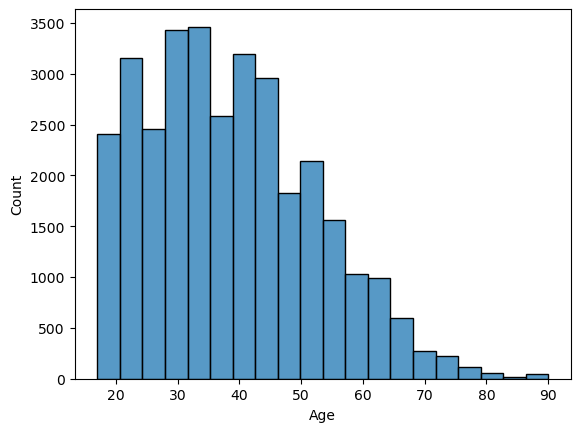

In [11]:
#Let's viaualize the 'age' attribute

sns.histplot(x='Age', data=data, bins=20)
plt.show()

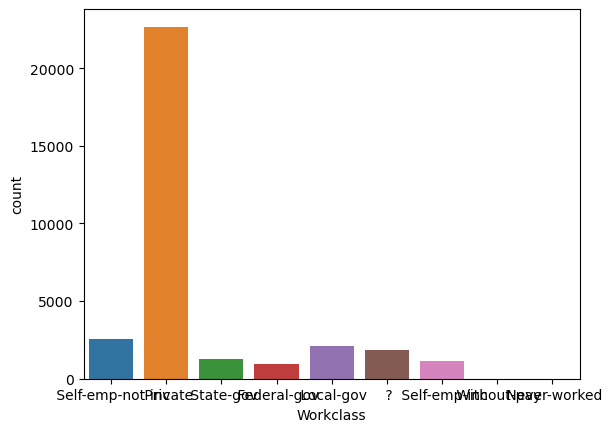

 Private             22673
 Self-emp-not-inc     2540
 Local-gov            2093
 ?                    1836
 State-gov            1297
 Self-emp-inc         1116
 Federal-gov           960
 Without-pay            14
 Never-worked            7
Name: Workclass, dtype: int64

In [12]:
#Let's viaualize the 'Workclass' attribute
sns.countplot(x='Workclass', data=data)
plt.show()
data['Workclass'].value_counts()

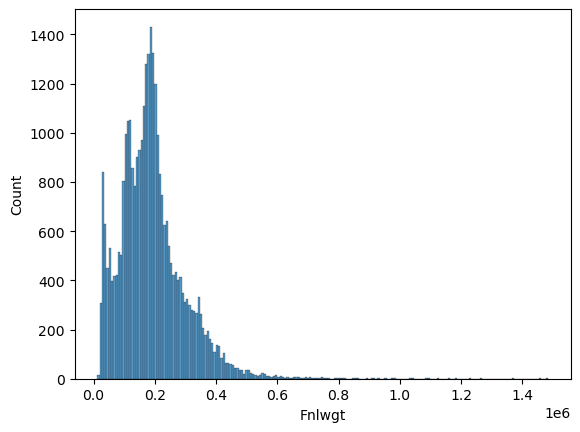

123011    13
164190    13
203488    13
121124    12
126675    12
          ..
158040     1
232784     1
325573     1
140176     1
257302     1
Name: Fnlwgt, Length: 21647, dtype: int64

In [13]:
#Let's viaualize the 'Fnlwgt' attribute
sns.histplot(x='Fnlwgt', data=data)
plt.show()
data['Fnlwgt'].value_counts()

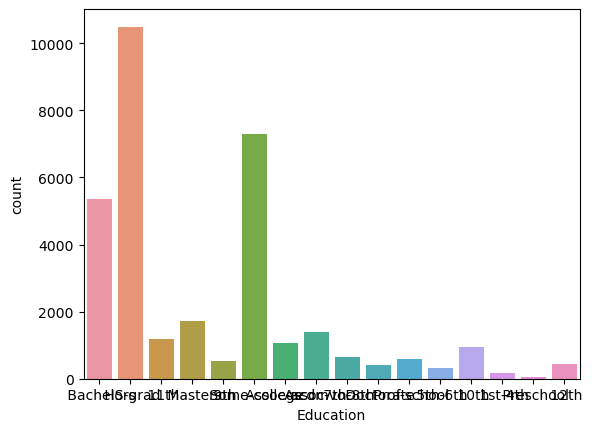

 HS-grad         10494
 Some-college     7282
 Bachelors        5352
 Masters          1722
 Assoc-voc        1382
 11th             1175
 Assoc-acdm       1067
 10th              933
 7th-8th           645
 Prof-school       576
 9th               514
 12th              433
 Doctorate         413
 5th-6th           332
 1st-4th           166
 Preschool          50
Name: Education, dtype: int64

In [14]:
#Let's visualize the 'Education' attribute
sns.countplot(x='Education', data=data)
plt.show()
data['Education'].value_counts()

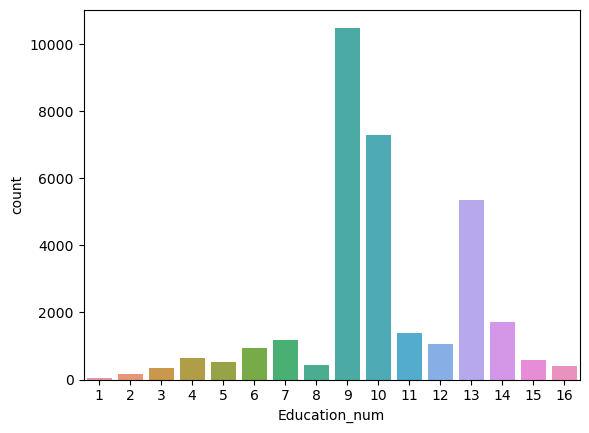

9     10494
10     7282
13     5352
14     1722
11     1382
7      1175
12     1067
6       933
4       645
15      576
5       514
8       433
16      413
3       332
2       166
1        50
Name: Education_num, dtype: int64

In [15]:
#Let's visualize the 'Education_num' attribute
sns.countplot(x='Education_num', data=data)
plt.show()
data['Education_num'].value_counts()

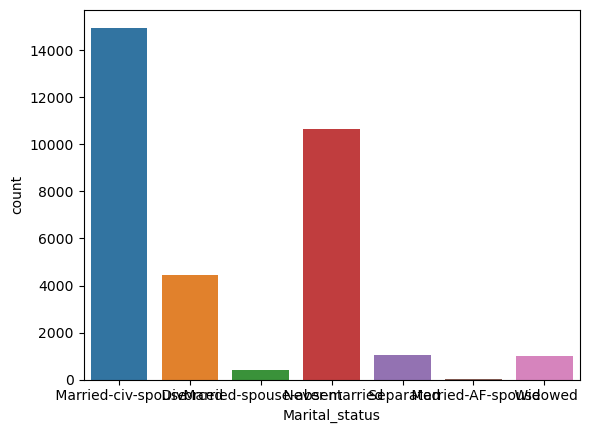

 Married-civ-spouse       14970
 Never-married            10666
 Divorced                  4441
 Separated                 1025
 Widowed                    993
 Married-spouse-absent      418
 Married-AF-spouse           23
Name: Marital_status, dtype: int64

In [16]:
#Let's visualize the 'Marital_status' attribute
sns.countplot(x='Marital_status', data=data)
plt.show()
data['Marital_status'].value_counts()

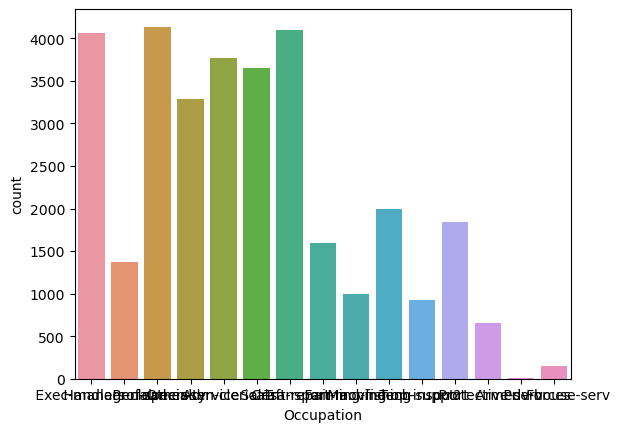

 Prof-specialty       4136
 Craft-repair         4094
 Exec-managerial      4065
 Adm-clerical         3767
 Sales                3650
 Other-service        3291
 Machine-op-inspct    2000
 ?                    1843
 Transport-moving     1597
 Handlers-cleaners    1369
 Farming-fishing       992
 Tech-support          927
 Protective-serv       649
 Priv-house-serv       147
 Armed-Forces            9
Name: Occupation, dtype: int64

In [17]:
#Let's visualize the 'Occupation' attribute
sns.countplot(x='Occupation', data=data)
plt.show()
data['Occupation'].value_counts()

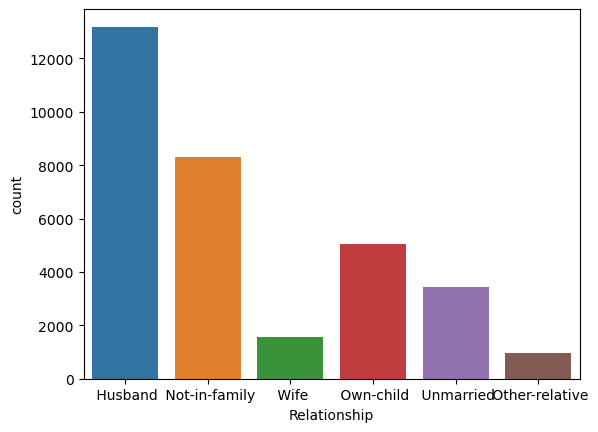

 Husband           13187
 Not-in-family      8291
 Own-child          5064
 Unmarried          3445
 Wife               1568
 Other-relative      981
Name: Relationship, dtype: int64

In [18]:
#Let's visualize the 'Relationship' attribute
sns.countplot(x='Relationship', data=data)
plt.show()
data['Relationship'].value_counts()

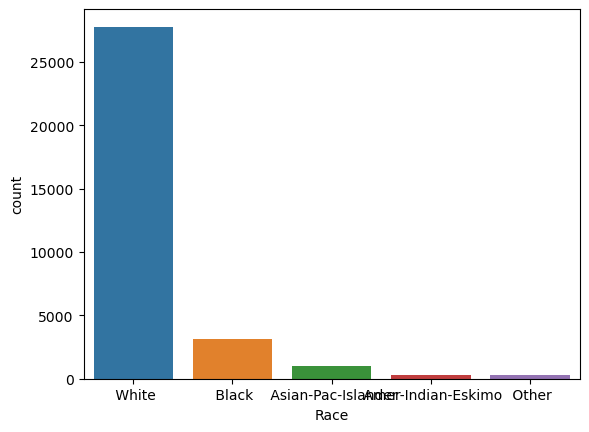

 White                 27794
 Black                  3122
 Asian-Pac-Islander     1038
 Amer-Indian-Eskimo      311
 Other                   271
Name: Race, dtype: int64

In [19]:
#Let's visualize the 'Race' attribute
sns.countplot(x='Race', data=data)
plt.show()
data['Race'].value_counts()

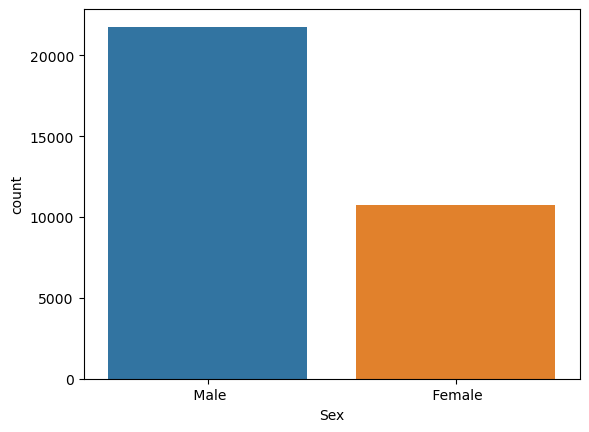

 Male      21774
 Female    10762
Name: Sex, dtype: int64

In [20]:
#Let's visualize the 'Sex' attribute
sns.countplot(x='Sex', data=data)
plt.show()
data['Sex'].value_counts()

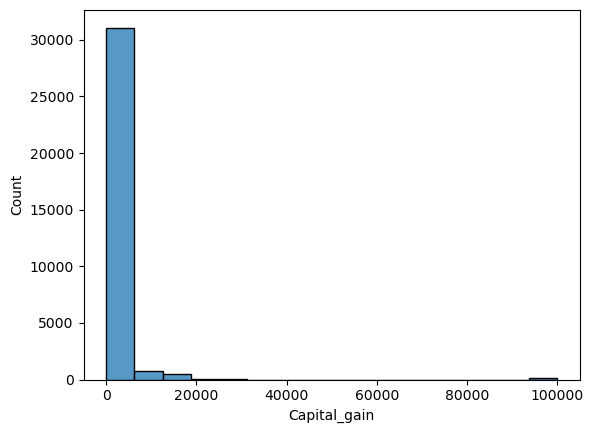

0        29825
15024      347
7688       284
7298       246
99999      159
         ...  
1111         1
2538         1
22040        1
4931         1
5060         1
Name: Capital_gain, Length: 119, dtype: int64

In [21]:
#Let's visualize the 'Capital_gain' attribute
sns.histplot(x='Capital_gain', data=data)
plt.show()
data['Capital_gain'].value_counts()

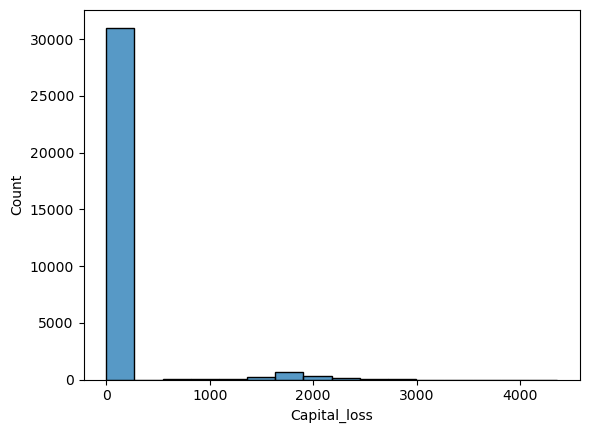

0       31017
1902      202
1977      168
1887      159
1848       51
        ...  
2080        1
1539        1
1844        1
2489        1
1411        1
Name: Capital_loss, Length: 92, dtype: int64

In [22]:
#Let's visualize the 'Capital_gain' attribute
sns.histplot(x='Capital_loss', data=data)
plt.show()
data['Capital_loss'].value_counts()

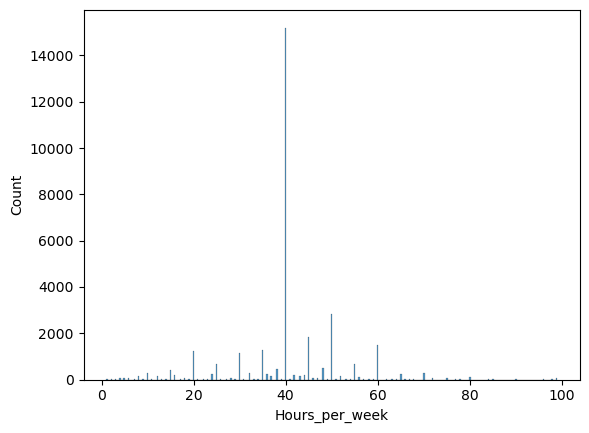

40    15203
50     2817
45     1823
60     1475
35     1296
      ...  
82        1
94        1
92        1
74        1
87        1
Name: Hours_per_week, Length: 94, dtype: int64

In [23]:
#Let's visualize the 'Hours_per_week' attribute
sns.histplot(x='Hours_per_week', data=data)
plt.show()
data['Hours_per_week'].value_counts()

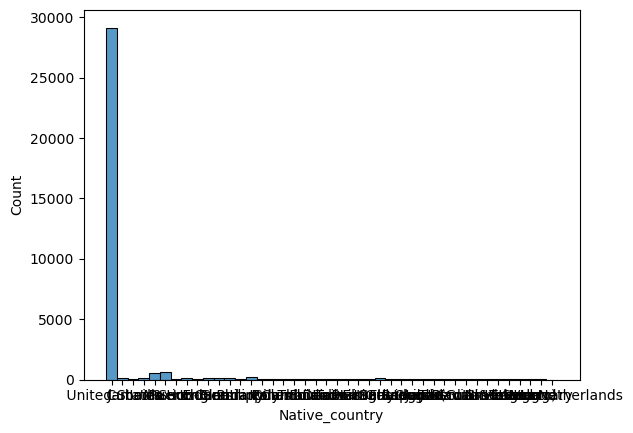

 United-States                 29152
 Mexico                          639
 ?                               582
 Philippines                     198
 Germany                         137
 Canada                          121
 Puerto-Rico                     114
 El-Salvador                     106
 India                           100
 Cuba                             95
 England                          90
 Jamaica                          81
 South                            80
 China                            75
 Italy                            73
 Dominican-Republic               70
 Vietnam                          67
 Japan                            62
 Guatemala                        62
 Poland                           60
 Columbia                         59
 Taiwan                           51
 Haiti                            44
 Iran                             43
 Portugal                         37
 Nicaragua                        34
 Peru                             31
 

In [24]:
#Let's visualize the 'Native_country' attribute
sns.histplot(x='Native_country', data=data)
plt.show()
data['Native_country'].value_counts()

In [25]:
data.drop('Education', axis=1, inplace=True)

In [26]:
#Let's encode the columns with object data type.
le=LabelEncoder()
for column in data.columns:
    if data[column].dtypes == 'object':
        data[column] = le.fit_transform(data[column])


# Bivariant Analysis

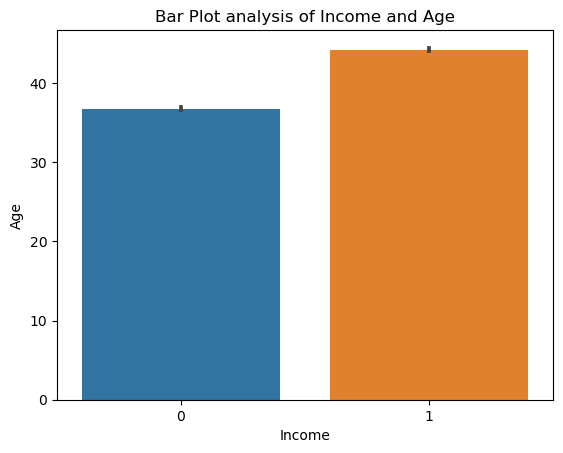

In [27]:
sns.barplot(x='Income', y='Age', data=data)
plt.title('Bar Plot analysis of Income and Age')
plt.show()

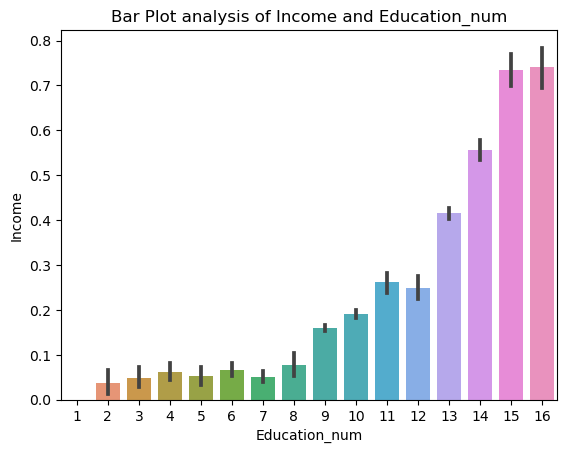

In [28]:

sns.barplot(x='Education_num', y='Income', data=data)
plt.title('Bar Plot analysis of Income and Education_num')
plt.show()

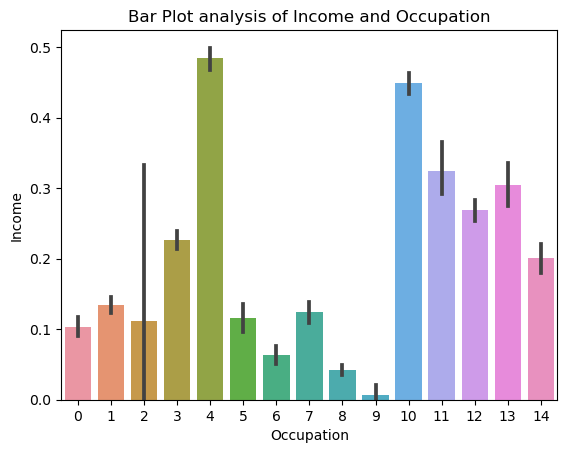

In [29]:

sns.barplot(x='Occupation', y='Income', data=data)
plt.title('Bar Plot analysis of Income and Occupation')
plt.show()

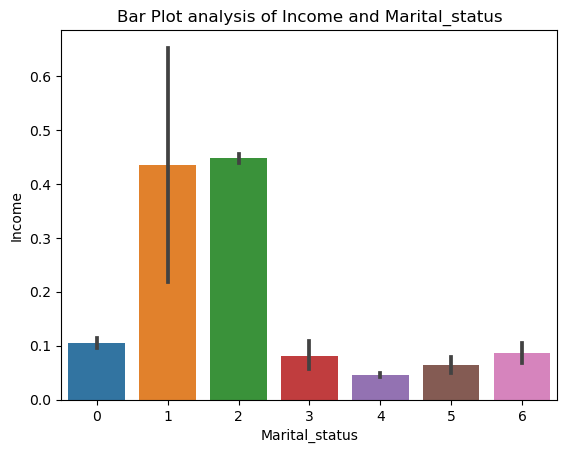

In [30]:

sns.barplot(x='Marital_status', y='Income', data=data)
plt.title('Bar Plot analysis of Income and Marital_status')
plt.show()

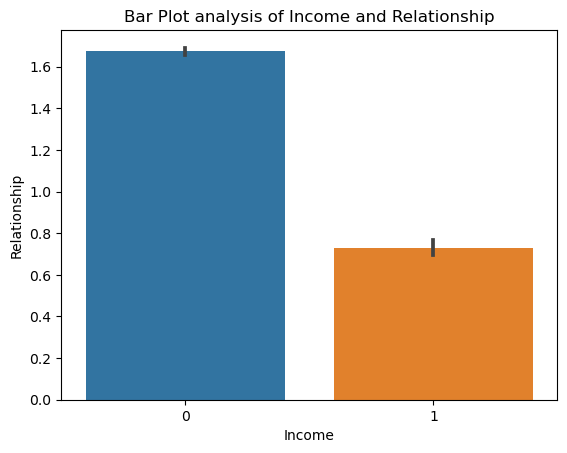

In [31]:
sns.barplot(x='Income', y='Relationship', data=data)
plt.title('Bar Plot analysis of Income and Relationship')
plt.show()

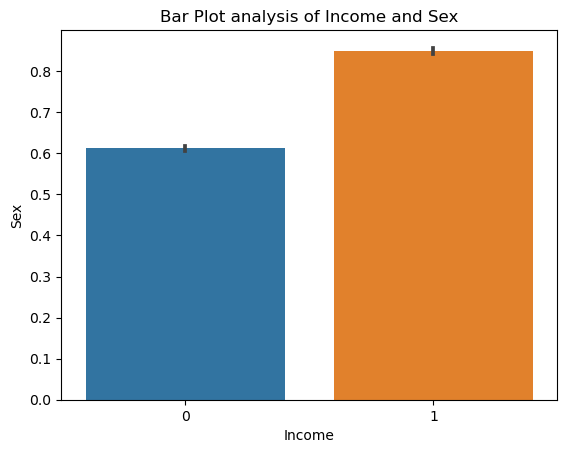

In [32]:
sns.barplot(x='Income', y='Sex', data=data)
plt.title('Bar Plot analysis of Income and Sex')
plt.show()

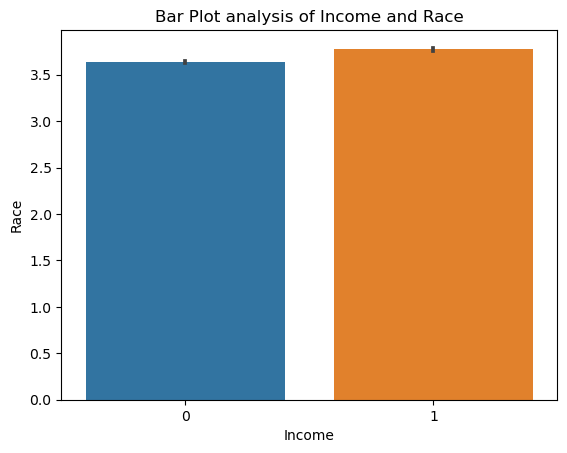

In [33]:
sns.barplot(x='Income', y='Race', data=data)
plt.title('Bar Plot analysis of Income and Race')
plt.show()

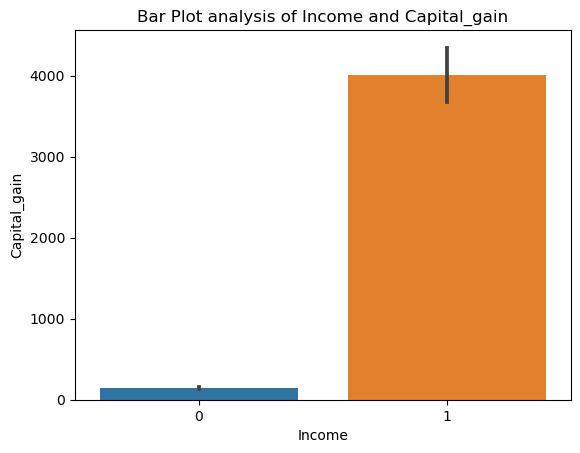

In [34]:
sns.barplot(x='Income', y='Capital_gain', data=data)
plt.title('Bar Plot analysis of Income and Capital_gain')
plt.show()

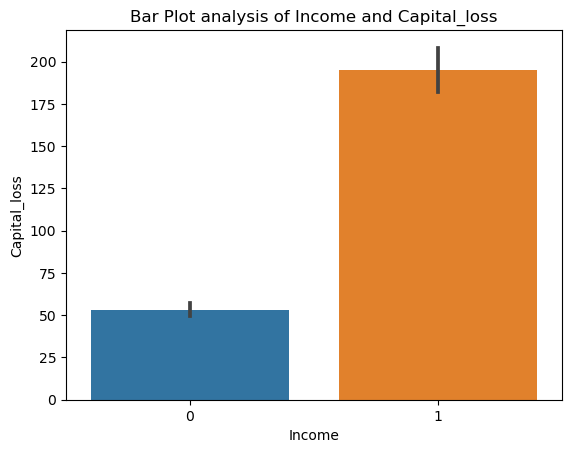

In [35]:
sns.barplot(x='Income', y='Capital_loss', data=data)
plt.title('Bar Plot analysis of Income and Capital_loss')
plt.show()

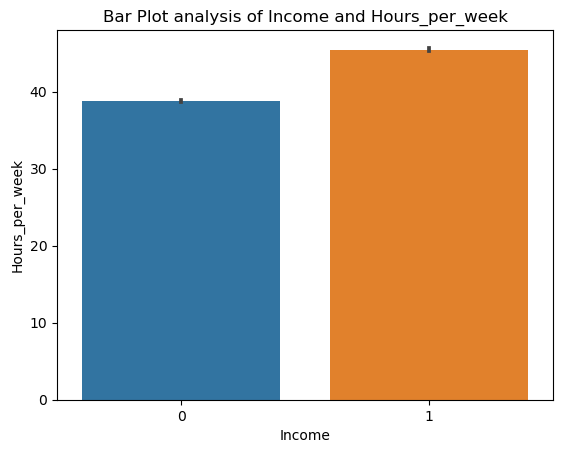

In [36]:
sns.barplot(x='Income', y='Hours_per_week', data=data)
plt.title('Bar Plot analysis of Income and Hours_per_week')
plt.show()

# Multivariant Data Analysis

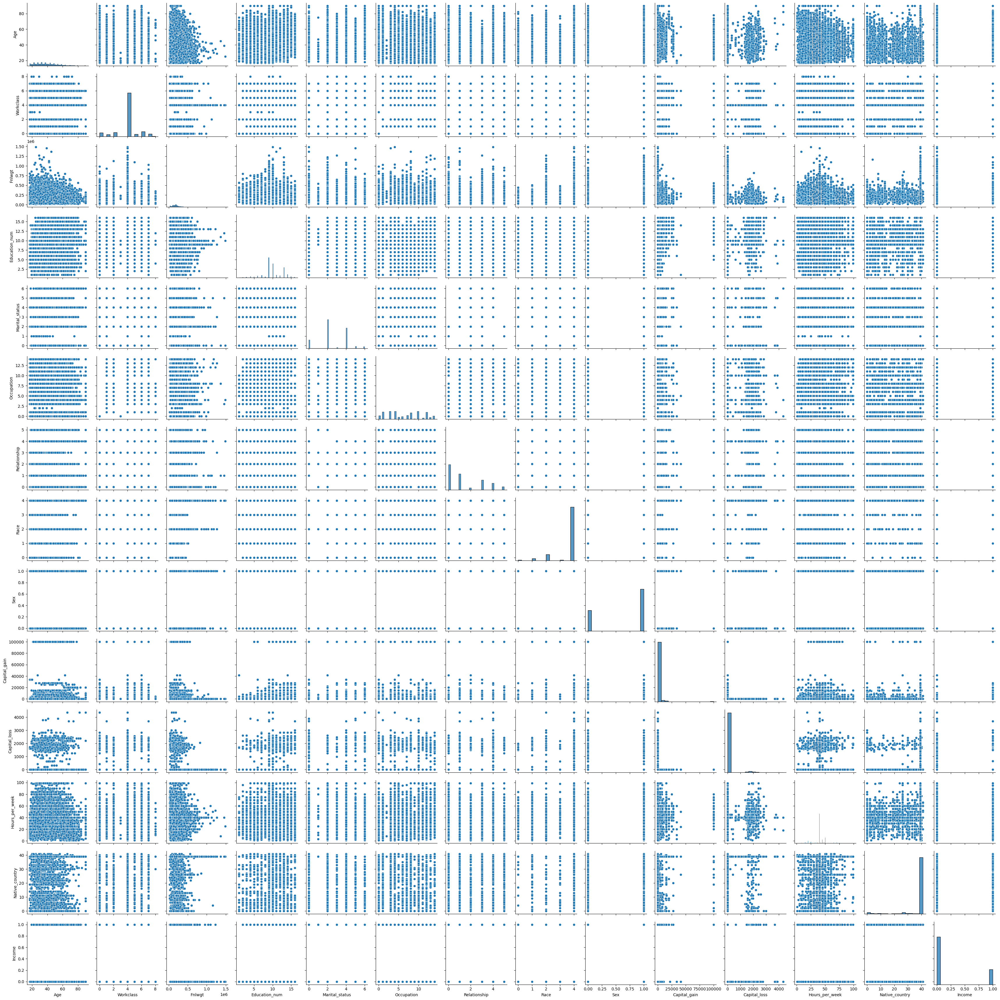

In [37]:
sns.pairplot(data)
plt.show()

         Let's check for the outliers in the dataset

In [38]:
z=np.abs(zscore(data))

In [39]:
threshold= 3
print(np.where(z>3))

(array([    3,     9,    10, ..., 32508, 32526, 32528], dtype=int64), array([12, 11,  7, ...,  7,  7,  7], dtype=int64))


In [40]:
df= data[(z<3). all(axis=1) ]

In [41]:
#let's check the skewness 
df.skew()

Age                0.483537
Workclass         -0.737658
Fnlwgt             0.627331
Education_num     -0.143317
Marital_status    -0.043793
Occupation         0.130948
Relationship       0.749953
Race              -2.592371
Sex               -0.684100
Capital_gain       4.933077
Capital_loss      29.316076
Hours_per_week    -0.357277
Native_country    -5.466051
Income             1.324408
dtype: float64

In [42]:
df['Capital_loss'] = np.log1p(df['Capital_loss'])
df['Capital_loss'].skew()

24.838742066940345

In [43]:
df['Race'], lambda_bestfit = stats.boxcox(df['Race'])
df['Race'].skew()

-2.53296881607994

In [44]:
#Let's check the correlation of the attributes

corr=df.corr()
corr

,Age,Workclass,Fnlwgt,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
Age,1.000000,0.005538,-0.077694,0.044101,-0.285523,-0.015513,-0.270292,0.023421,0.088664,0.132047,0.022440,0.090872,0.031776,0.240757
Workclass,0.005538,1.000000,-0.021130,0.049573,-0.061768,0.249600,-0.089856,0.063949,0.092386,0.025062,-0.006958,0.126912,-0.002418,0.040671
Fnlwgt,-0.077694,-0.021130,1.000000,-0.040811,0.029437,-0.003139,0.016436,-0.103527,0.022181,-0.003404,0.001419,-0.019179,-0.101024,-0.011567
Education_num,0.044101,0.049573,-0.040811,1.000000,-0.058538,0.110978,-0.094597,0.088000,0.004061,0.157663,0.006960,0.157744,0.139835,0.320591
Marital_status,-0.285523,-0.061768,0.029437,-0.058538,1.000000,-0.007902,0.183055,-0.084396,-0.125698,-0.069235,-0.018006,-0.198608,-0.033651,-0.193262
Occupation,-0.015513,0.249600,-0.003139,0.110978,-0.007902,1.000000,-0.077505,0.012235,0.081703,0.023035,-0.000872,0.069447,0.010373,0.070073
Relationship,-0.270292,-0.089856,0.016436,-0.094597,0.183055,-0.077505,1.000000,-0.146620,-0.576101,-0.091325,0.036746,-0.262555,-0.021103,-0.248005
Race,0.023421,0.063949,-0.103527,0.088000,-0.084396,0.012235,-0.146620,1.000000,0.125328,0.032521,-0.002937,0.059926,0.071050,0.095537
Sex,0.088664,0.092386,0.022181,0.004061,-0.125698,0.081703,-0.576101,0.125328,1.000000,0.070967,-0.033042,0.236269,-0.004154,0.211909
Capital_gain,0.132047,0.025062,-0.003404,0.157663,-0.069235,0.023035,-0.091325,0.032521,0.070967,1.000000,-0.009904,0.098414,0.021773,0.342689


<AxesSubplot:>

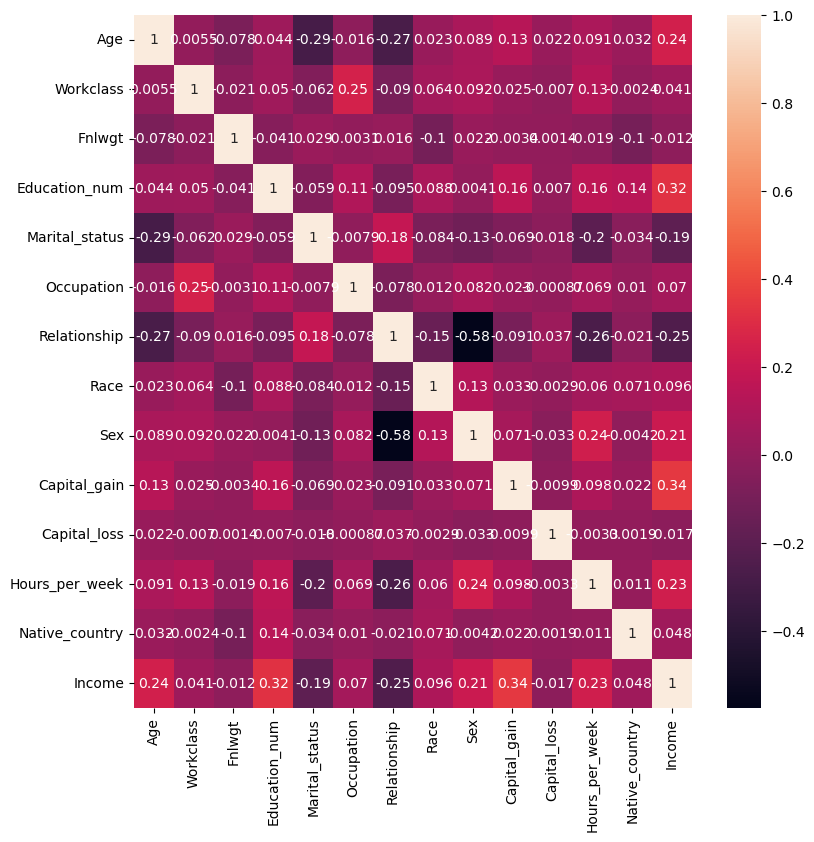

In [47]:
plt.figure(figsize=(9,9))
sns.heatmap(corr, annot=True)

              Let's split the independent and target values to apply the model

In [48]:
df_x = df.iloc[:,0:-1]

In [49]:
#Let's apply the Standard scaler, scaling technique
scaler=StandardScaler()
x= scaler.fit_transform(df_x)

In [50]:
y= df.iloc[:,-1]

In [63]:
#Let's apply Logistic Regression and check the highest accuracy score that can be obtained and the random state at which
idle_score = 0.70

best_random_state = None
best_accuracy = 0.0

for r_state in range(42,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20, random_state=r_state)
    lg=LogisticRegression()
    lg.fit(x_train,y_train)
    lgpred=lg.predict(x_test)
    acc = accuracy_score(y_test,lgpred)
    
    if acc> best_accuracy:
        best_accuracy= acc
        best_randome_state = r_state

if best_accuracy > idle_score:
    print("The best accuracy rate is", best_accuracy, "for random state:", best_randome_state)
else:
    print("No random state achieved an accuracy greater than the threshold.")
    

The best accuracy rate is 0.8375912408759124 for random state: 75


We acheived the highest accuracy rate using Logistic Regression, that is 0.84 at the random state of 9

In [64]:
#Let's try using the RandomForest Classifier 
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier()

idle_score = 0.84

best_random_state = None
best_accuracy = 0.0

for r_state in range(42,100):
    x_train,x_test,y_train,y_test= train_test_split(x,y, test_size=0.20, random_state=r_state)
    model= RandomForestClassifier()
    model.fit(x_test,y_test)
    modelpred=model.predict(x_test)
    acc= accuracy_score(y_test,modelpred)
    
    if acc> best_accuracy:
        best_accuracy= acc
        best_random_state= r_state
   

if best_accuracy > idle_score:
    print("the best Accuracy rate is ", best_accuracy, "For Random State ", best_random_state)
else:
    Print("No randome state achieved the accuracy greater than the threshold")



the best Accuracy rate is  1.0 For Random State  42


In [65]:
#Let's print the confusion_matrix of the Random_forest_model
print(confusion_matrix(y_test,modelpred))

[[4250    0]
 [   0 1230]]


<AxesSubplot:>

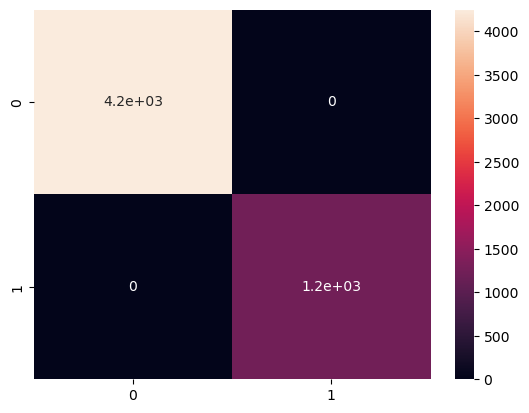

In [66]:
sns.heatmap(confusion_matrix(y_test,modelpred), annot=True)

In [67]:
#Let's print the Classification_report of the Random_forest_model
print(classification_report(y_test,modelpred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4250
           1       1.00      1.00      1.00      1230

    accuracy                           1.00      5480
   macro avg       1.00      1.00      1.00      5480
weighted avg       1.00      1.00      1.00      5480



# Saving the model

In [68]:
import joblib
filename = 'random_forest_model.pkl'
joblib.dump(model, filename)
print(f'Model saved as {filename}')

Model saved as random_forest_model.pkl


# Rainfall Weather Forecasting

In [69]:
import pandas as pd
import numpy as np
import sklearn
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from scipy.stats import zscore
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix


Let's Load the csv file to the 'rf' variable

In [70]:
rf = pd.read_csv("C:/Users/vaddi/Downloads/weatherAUS.csv")
rf

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


# Problem Statement:
a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow. 


b) Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.

In [71]:
#Let's check the data types of each column present in the dataset and the data type
rf.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

In [72]:
rf.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [73]:
# Remove duplicates and keep the first occurrence
rf_no_duplicates = rf.drop_duplicates(inplace=True)

In [74]:
rf.shape

(6762, 23)

In [75]:
#Let's see the value counts in each column of the dataset
for i in rf.columns:
    v= rf[i].value_counts()
    print("The unique value in ", i ,"is", v)
    print("*"*30)

The unique value in  Date is 2011-02-11    4
2011-02-18    4
2011-03-18    4
2011-03-19    4
2011-03-20    4
             ..
2016-11-03    1
2016-11-02    1
2016-11-01    1
2016-10-31    1
2013-06-08    1
Name: Date, Length: 3004, dtype: int64
******************************
The unique value in  Location is PerthAirport    1204
Albury           907
Newcastle        822
Melbourne        811
Williamtown      615
CoffsHarbour     611
Brisbane         579
Penrith          482
Darwin           250
Wollongong       237
Adelaide         205
Uluru             39
Name: Location, dtype: int64
******************************
The unique value in  MinTemp is 13.2    58
12.0    57
14.8    53
12.7    53
10.8    52
        ..
26.6     1
28.0     1
26.9     1
1.4      1
26.0     1
Name: MinTemp, Length: 285, dtype: int64
******************************
The unique value in  MaxTemp is 19.0    66
19.8    62
20.8    54
23.8    54
25.0    54
        ..
38.9     1
10.3     1
9.4      1
42.5     1
43.5     1
Na

In [76]:
#Let's seperate the columns with the categorical and numerical data types
categorical= []
numerical = []
for i in rf.columns:
    if rf[i].dtypes == 'object':
        categorical.append(i)
    else:
        numerical.append(i)
print("Categorical coulumns are ", len(categorical), categorical)
print("Numerical columns are ", len(numerical), numerical)

Categorical coulumns are  7 ['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']
Numerical columns are  16 ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']


In [77]:
#Let's fill the null values is the data set
for i in rf.columns:
    if rf[i].isnull().sum() >0 :
        if rf[i].dtypes != 'object':
            median_value = rf[i].median()
            rf[i].fillna(median_value, inplace = True)
        if rf[i].dtypes =='object':
            mode_value= rf[i].mode()
            rf[i].fillna(mode_value[0], inplace=True)

In [79]:
#Let's drop the 'Date' column
rf.drop('Date', axis= 1, inplace=True)

In [80]:
#Let's encode the categorical columns
le =LabelEncoder()
for column in rf.columns:
    if rf[column].dtypes == 'object':
        rf[column]= le.fit_transform(rf[column])

In [81]:
rf.dtypes

Location           int32
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir        int32
WindGustSpeed    float64
WindDir9am         int32
WindDir3pm         int32
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday          int32
RainTomorrow       int32
dtype: object

Let's look into the statistical information of the dataset

In [82]:
rf.describe()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
count,6762.000000,6762.000000,6762.000000,6762.000000,6762.00000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,...,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000
mean,5.323721,13.110086,24.093301,2.723410,4.99898,8.421665,6.610470,38.702159,7.013310,7.842798,...,67.510500,50.460515,1017.621222,1015.116060,4.519817,4.511979,17.895830,22.700281,0.232476,0.232476
std,3.099455,5.540674,6.130367,10.490138,3.36177,2.789228,5.233746,13.393977,4.550702,4.486894,...,17.182756,18.498424,6.027923,5.967643,2.492344,2.343253,5.722418,5.972262,0.422442,0.422442
min,0.000000,-2.000000,8.200000,0.000000,0.00000,0.000000,0.000000,7.000000,0.000000,0.000000,...,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000,0.000000,0.000000
25%,2.250000,9.000000,19.600000,0.000000,4.00000,8.800000,1.000000,30.000000,3.000000,4.000000,...,56.000000,38.000000,1014.200000,1011.500000,2.000000,3.000000,13.900000,18.400000,0.000000,0.000000
50%,6.000000,13.200000,23.500000,0.000000,4.60000,9.000000,7.000000,37.000000,7.000000,9.000000,...,68.000000,50.000000,1017.600000,1015.100000,5.000000,5.000000,18.000000,22.100000,0.000000,0.000000
75%,8.000000,17.400000,28.400000,0.800000,5.00000,9.200000,12.000000,46.000000,11.000000,12.000000,...,80.000000,62.000000,1020.900000,1018.400000,7.000000,6.000000,22.200000,26.800000,0.000000,0.000000
max,11.000000,28.500000,45.500000,371.000000,145.00000,13.900000,15.000000,107.000000,15.000000,15.000000,...,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000,1.000000,1.000000


# Data Visualization

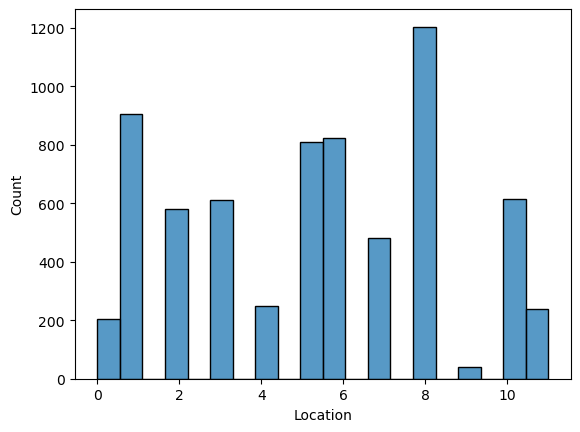

In [83]:
#Let's viaualize the 'Location' attribute

sns.histplot(x='Location', data=rf, bins=20)
plt.show()

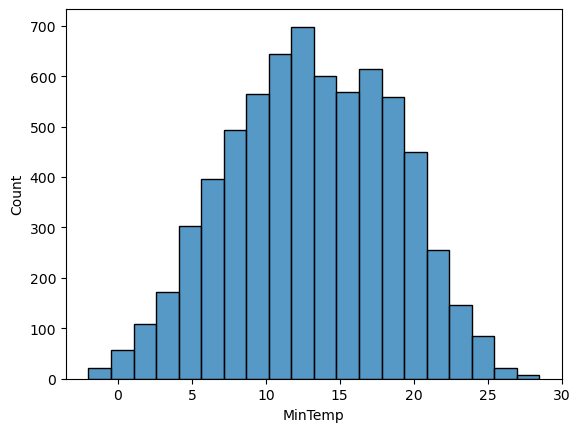

In [84]:
#Let's viaualize the 'MinTemp' attribute

sns.histplot(x='MinTemp', data=rf, bins=20)
plt.show()

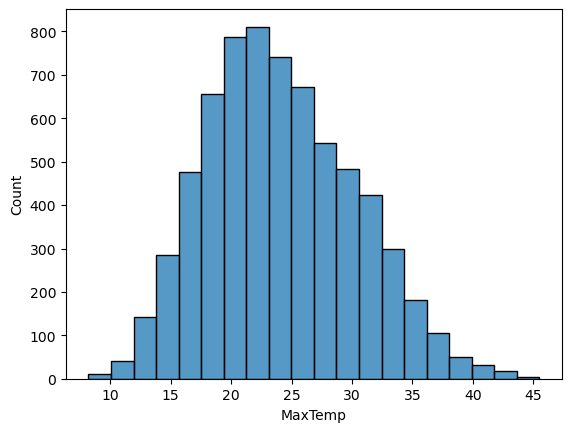

In [85]:
#Let's viaualize the 'MaxTemp' attribute

sns.histplot(x='MaxTemp', data=rf, bins=20)
plt.show()

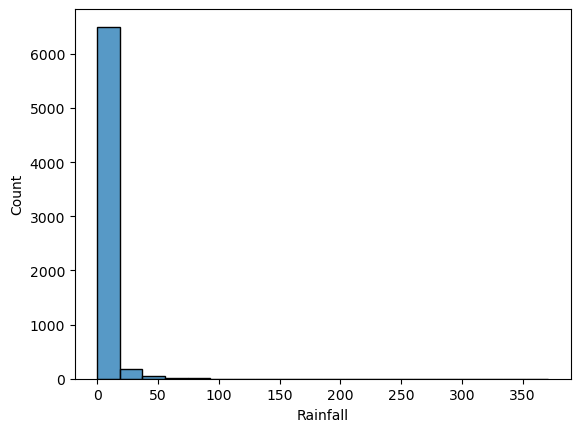

In [86]:
#Let's viaualize the 'Rainfall' attribute
sns.histplot(x='Rainfall', data=rf, bins=20)
plt.show()

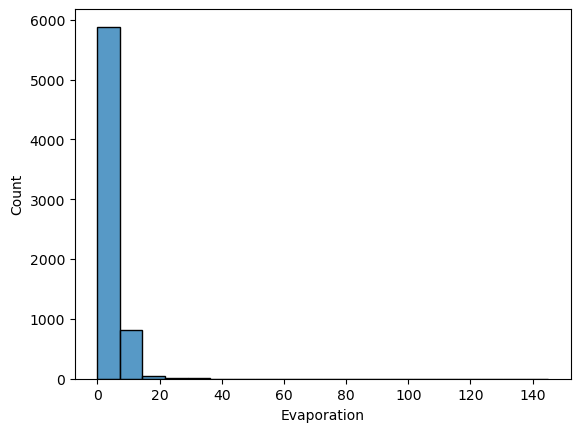

In [87]:
#Let's viaualize the 'Evaporation' attribute
sns.histplot(x='Evaporation', data=rf, bins=20)
plt.show()

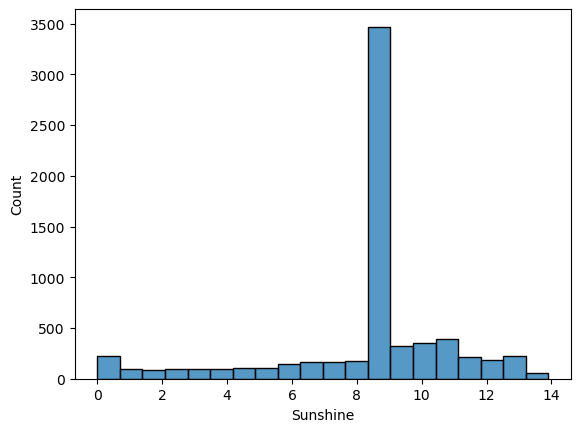

In [88]:
#Let's viaualize the 'Evaporation' attribute
sns.histplot(x='Sunshine', data=rf, bins=20)
plt.show()

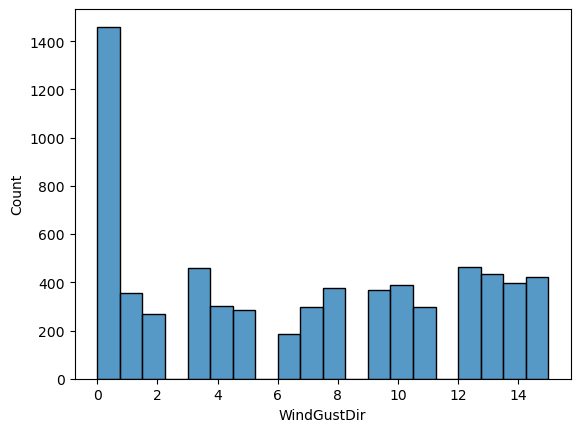

In [89]:
#Let's viaualize the 'WindGustDir' attribute
sns.histplot(x='WindGustDir', data=rf, bins=20)
plt.show()

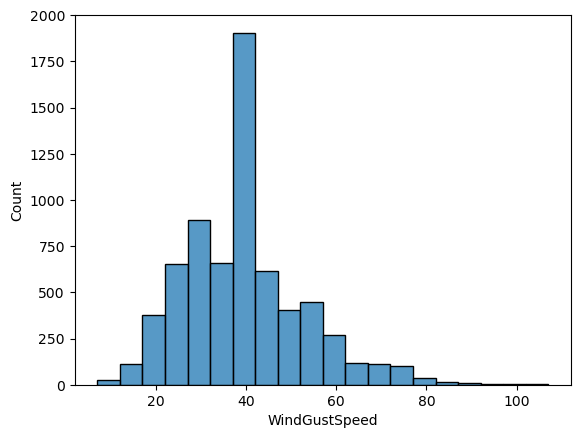

In [90]:
#Let's viaualize the 'WindGustSpeed' attribute
sns.histplot(x='WindGustSpeed', data=rf, bins=20)
plt.show()

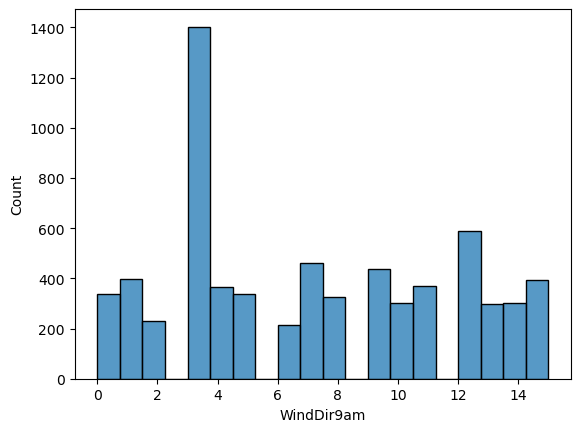

In [91]:
#Let's viaualize the 'WindDir9am' attribute
sns.histplot(x='WindDir9am', data=rf, bins=20)
plt.show()

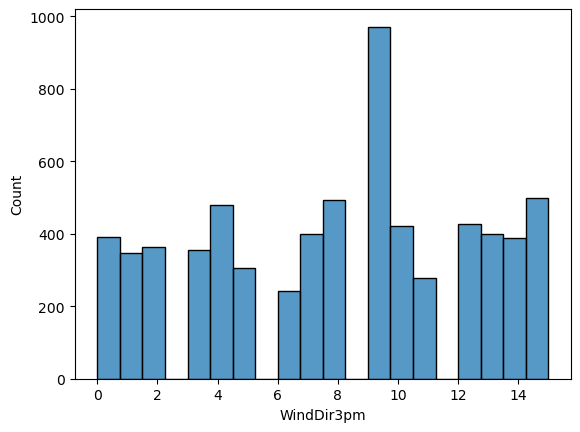

In [92]:
#Let's viaualize the 'WindDir3pm' attribute
sns.histplot(x='WindDir3pm', data=rf, bins=20)
plt.show()

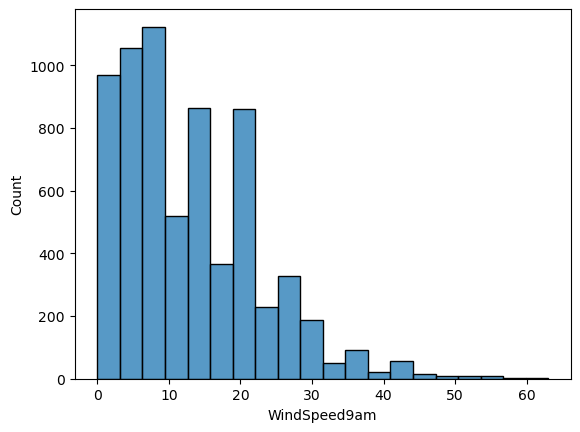

In [93]:
#Let's viaualize the 'WindSpeed9am' attribute
sns.histplot(x='WindSpeed9am', data=rf, bins=20)
plt.show()

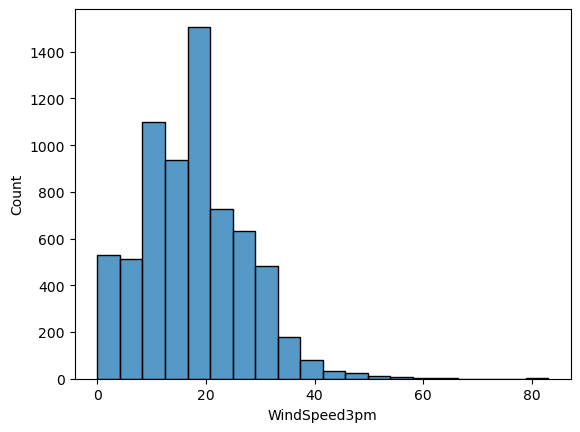

In [94]:
#Let's viaualize the 'WindSpeed3pm' attribute
sns.histplot(x='WindSpeed3pm', data=rf, bins=20)
plt.show()

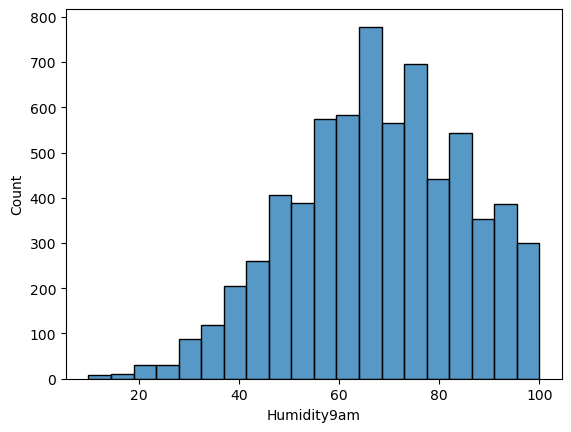

In [95]:
#Let's viaualize the 'Humidity9am' attribute
sns.histplot(x='Humidity9am', data=rf, bins=20)
plt.show()

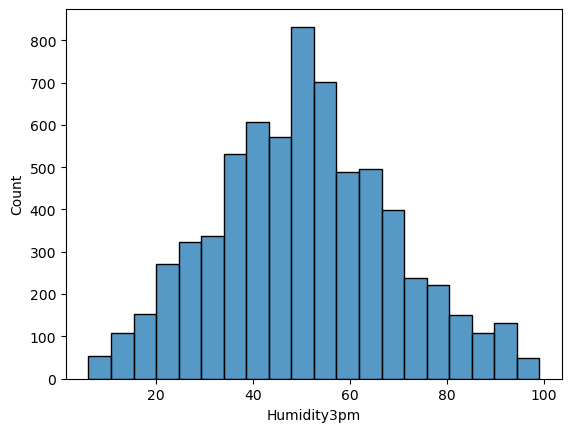

In [96]:
#Let's viaualize the 'Humidity3pm' attribute
sns.histplot(x='Humidity3pm', data=rf, bins=20)
plt.show()

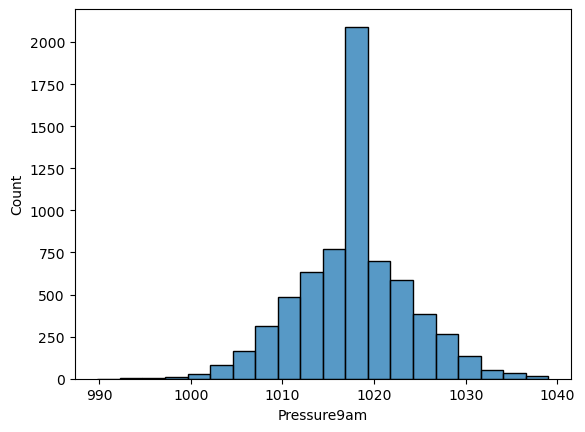

In [97]:
#Let's viaualize the 'Pressure9am' attribute
sns.histplot(x='Pressure9am', data=rf, bins=20)
plt.show()

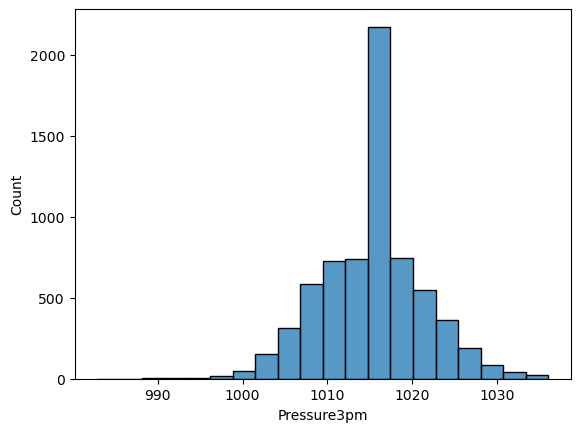

In [98]:
#Let's viaualize the 'Pressure3pm' attribute
sns.histplot(x='Pressure3pm', data=rf, bins=20)
plt.show()

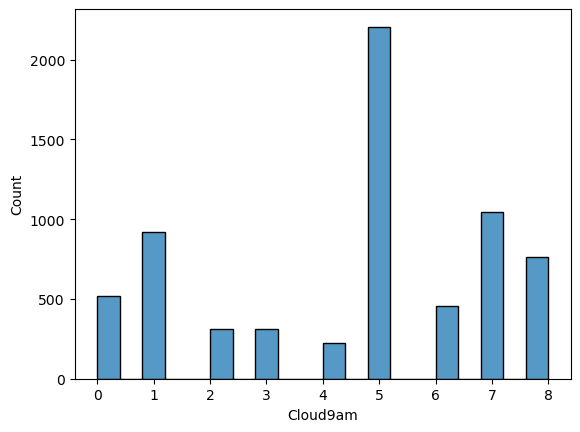

In [99]:
#Let's viaualize the 'Cloud9am' attribute
sns.histplot(x='Cloud9am', data=rf, bins=20)
plt.show()

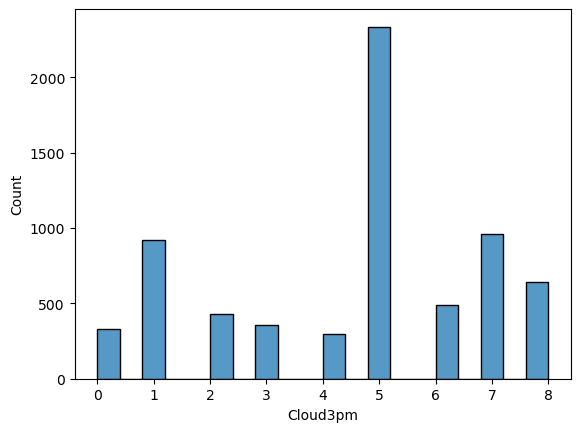

In [100]:
#Let's viaualize the 'Cloud3pm' attribute
sns.histplot(x='Cloud3pm', data=rf, bins=20)
plt.show()

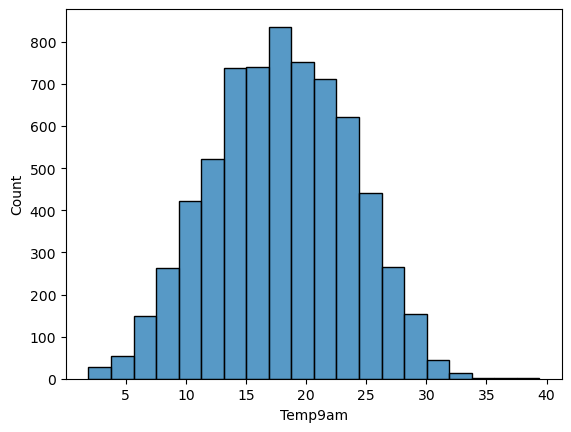

In [101]:
#Let's viaualize the 'Temp9am' attribute
sns.histplot(x='Temp9am', data=rf, bins=20)
plt.show()

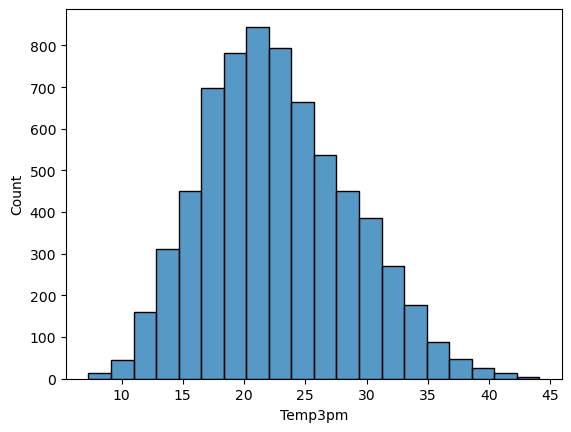

In [152]:
#Let's viaualize the 'Temp3pm' attribute
sns.histplot(x='Temp3pm', data=rf, bins=20)
plt.show()

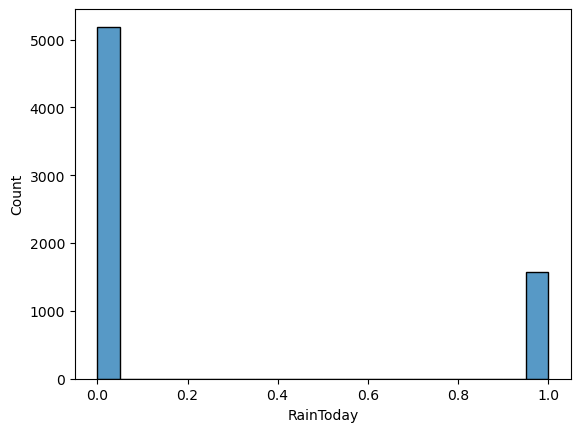

In [153]:
#Let's viaualize the 'RainToday' attribute
sns.histplot(x='RainToday', data=rf, bins=20)
plt.show()

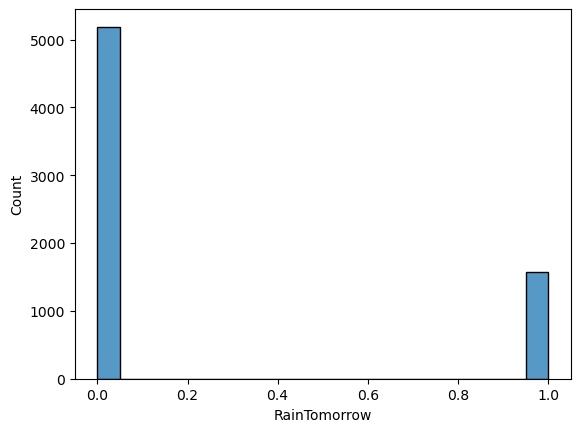

In [154]:
#Let's viaualize the 'RainTomorrow' attribute
sns.histplot(x='RainTomorrow', data=rf, bins=20)
plt.show()

# Bivariant Analysis

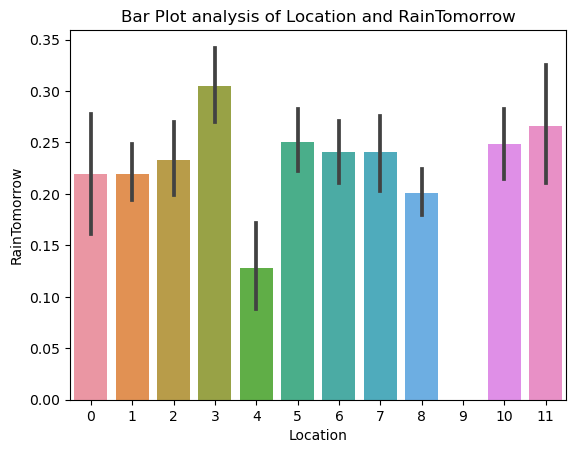

In [155]:
sns.barplot(x='Location', y='RainTomorrow', data=rf)
plt.title('Bar Plot analysis of Location and RainTomorrow')
plt.show()

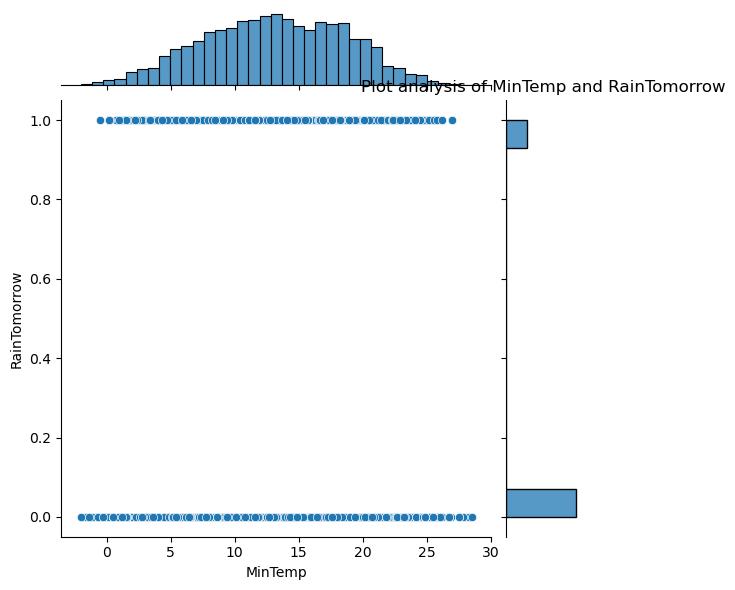

In [156]:
sns.jointplot(x='MinTemp', y='RainTomorrow', data=rf, kind='scatter')
plt.title('Plot analysis of MinTemp and RainTomorrow')
plt.show()


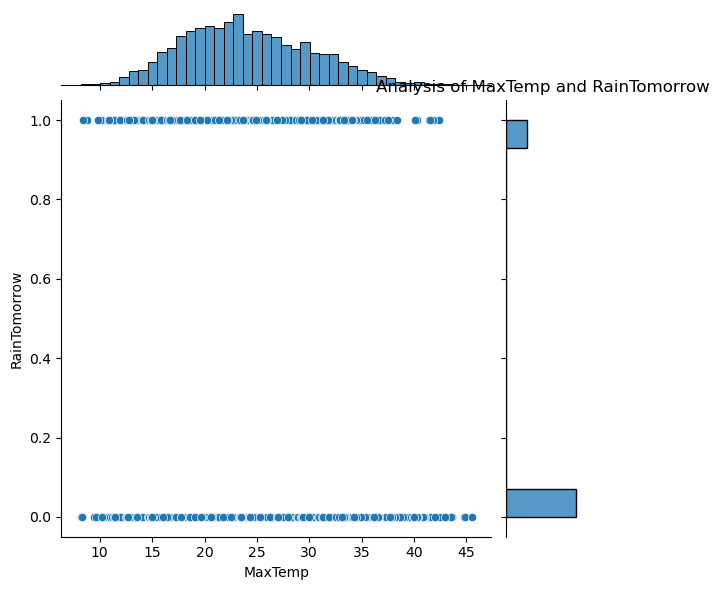

In [157]:
sns.jointplot(x='MaxTemp', y='RainTomorrow', data=rf, kind='scatter')
plt.title('Analysis of MaxTemp and RainTomorrow')
plt.show()

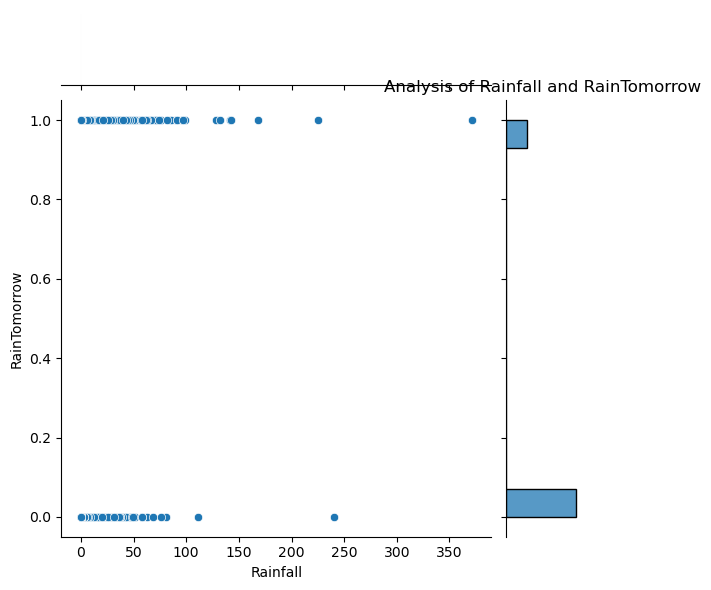

In [158]:
sns.jointplot(x='Rainfall', y='RainTomorrow', data=rf, kind='scatter')
plt.title('Analysis of Rainfall and RainTomorrow')
plt.show()

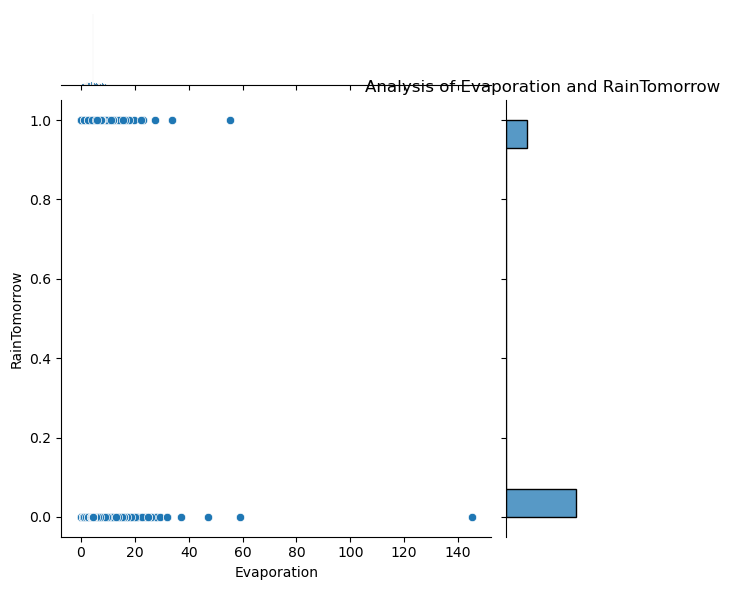

In [159]:
sns.jointplot(x='Evaporation', y='RainTomorrow', data=rf, kind='scatter')
plt.title('Analysis of Evaporation and RainTomorrow')
plt.show()

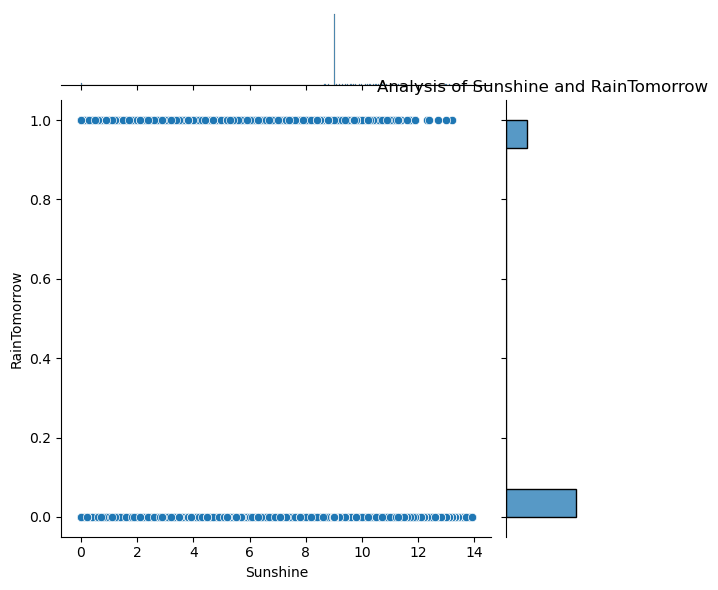

In [160]:
sns.jointplot(x='Sunshine', y='RainTomorrow', data=rf, kind='scatter')
plt.title('Analysis of Sunshine and RainTomorrow')
plt.show()

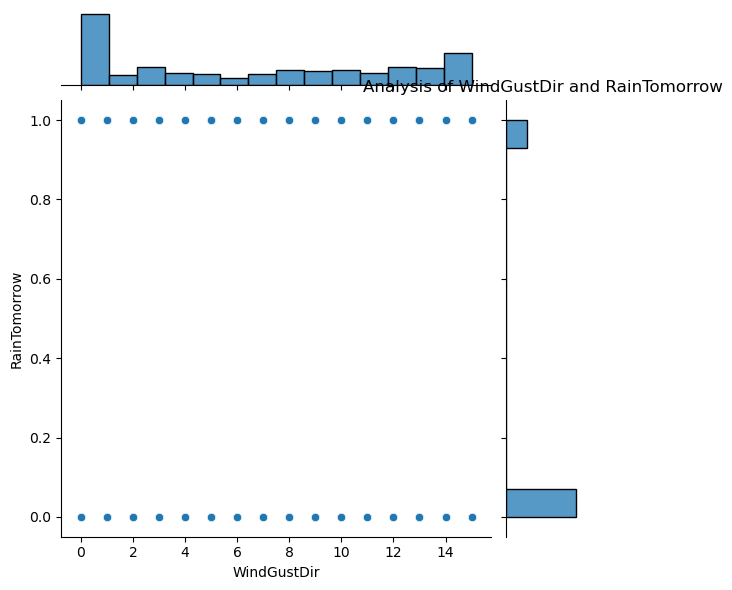

In [161]:
sns.jointplot(x='WindGustDir', y='RainTomorrow', data=rf, kind='scatter')
plt.title('Analysis of WindGustDir and RainTomorrow')
plt.show()

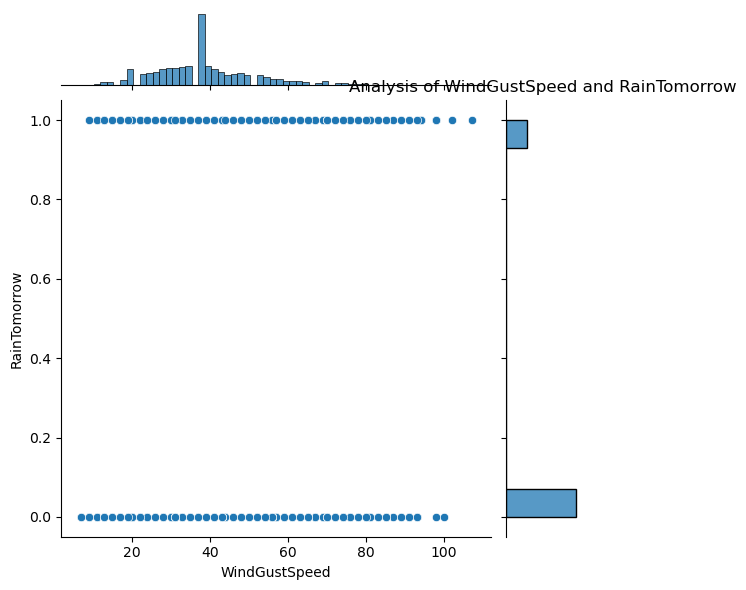

In [162]:
sns.jointplot(x='WindGustSpeed', y='RainTomorrow', data=rf, kind='scatter')
plt.title('Analysis of WindGustSpeed and RainTomorrow')
plt.show()

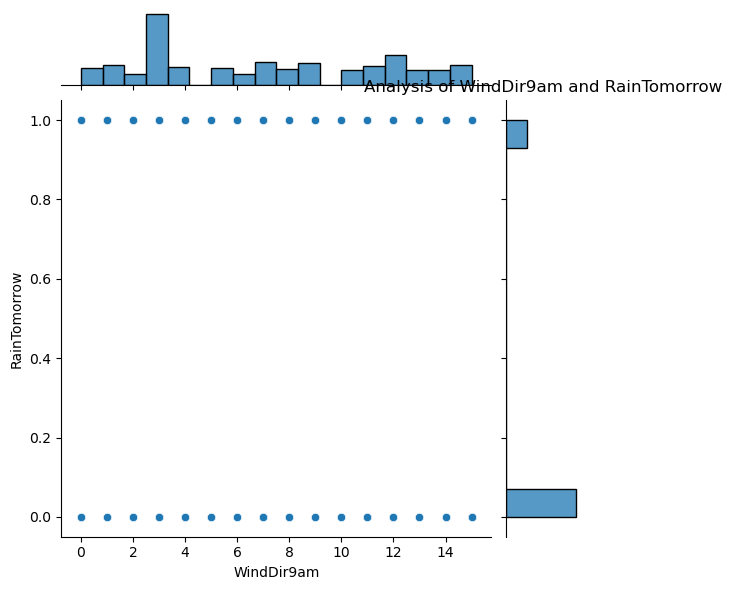

In [163]:
sns.jointplot(x='WindDir9am', y='RainTomorrow', data=rf, kind='scatter')
plt.title('Analysis of WindDir9am and RainTomorrow')
plt.show()

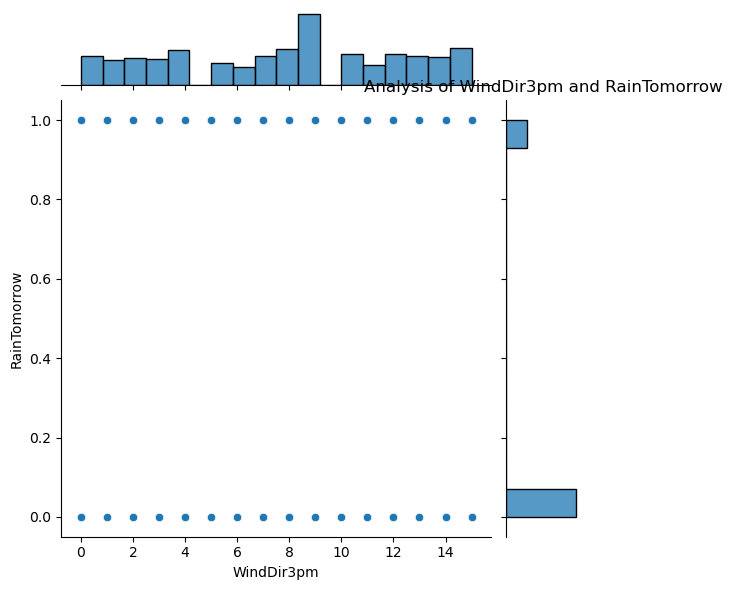

In [164]:
sns.jointplot(x='WindDir3pm', y='RainTomorrow', data=rf, kind='scatter')
plt.title('Analysis of WindDir3pm and RainTomorrow')
plt.show()

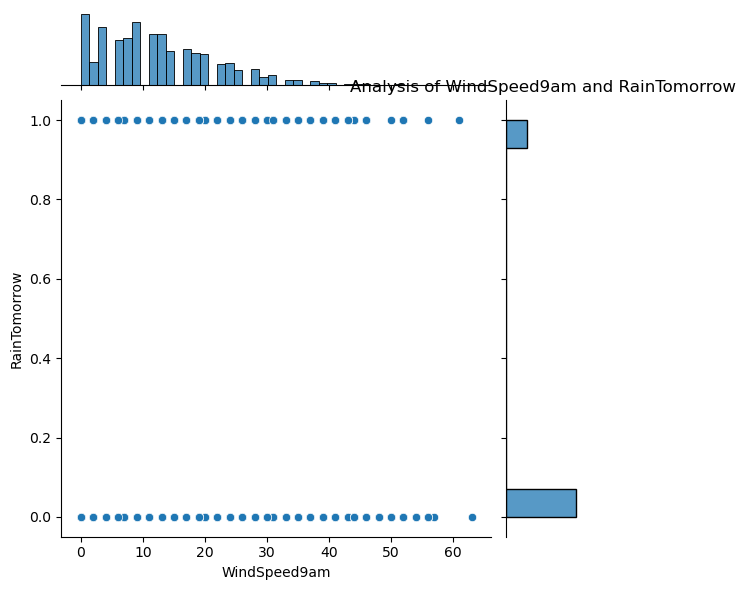

In [165]:
sns.jointplot(x='WindSpeed9am', y='RainTomorrow', data=rf, kind='scatter')
plt.title('Analysis of WindSpeed9am and RainTomorrow')
plt.show()

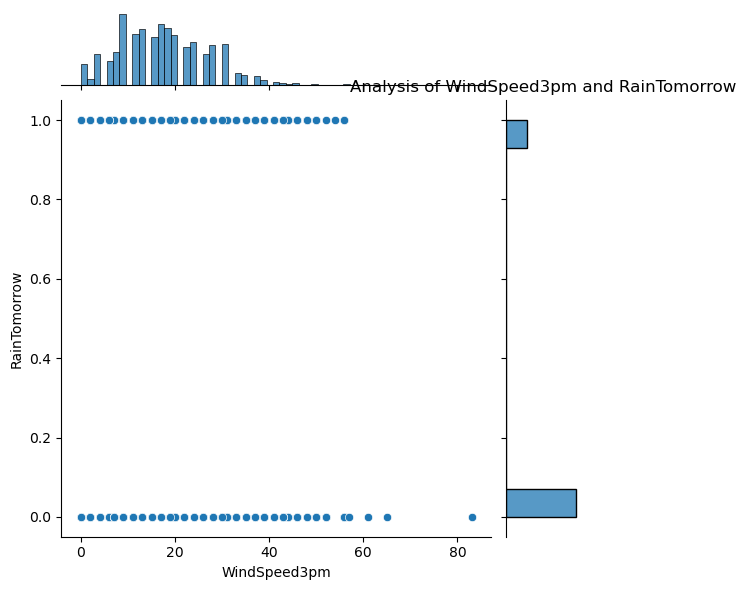

In [166]:
sns.jointplot(x='WindSpeed3pm', y='RainTomorrow', data=rf, kind='scatter')
plt.title('Analysis of WindSpeed3pm and RainTomorrow')
plt.show()

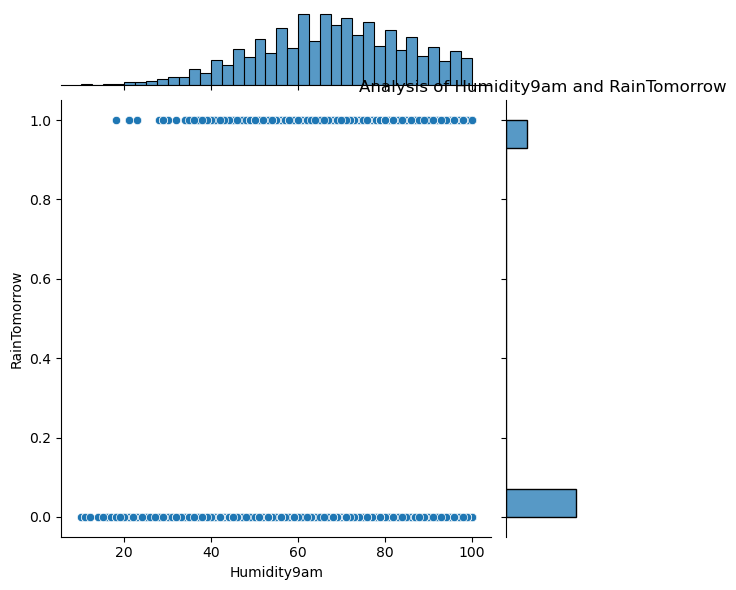

In [167]:
sns.jointplot(x='Humidity9am', y='RainTomorrow', data=rf, kind='scatter')
plt.title('Analysis of Humidity9am and RainTomorrow')
plt.show()

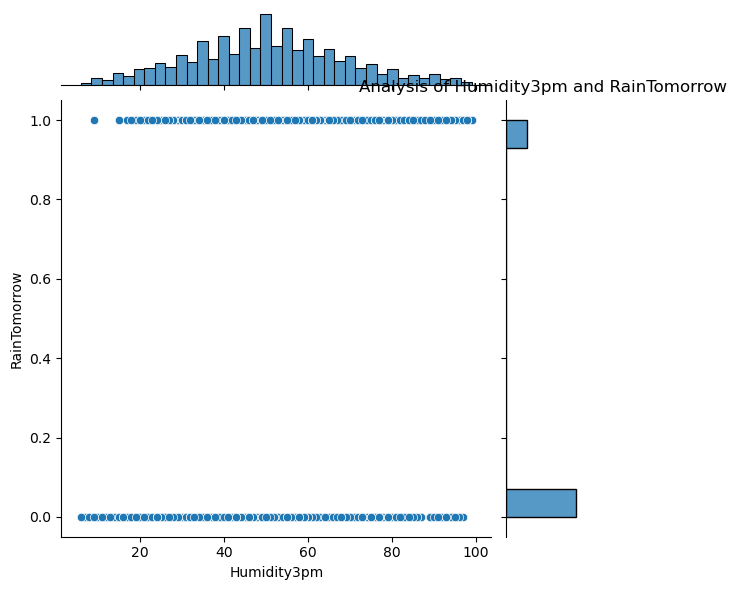

In [168]:
sns.jointplot(x='Humidity3pm', y='RainTomorrow', data=rf, kind='scatter')
plt.title('Analysis of Humidity3pm and RainTomorrow')
plt.show()

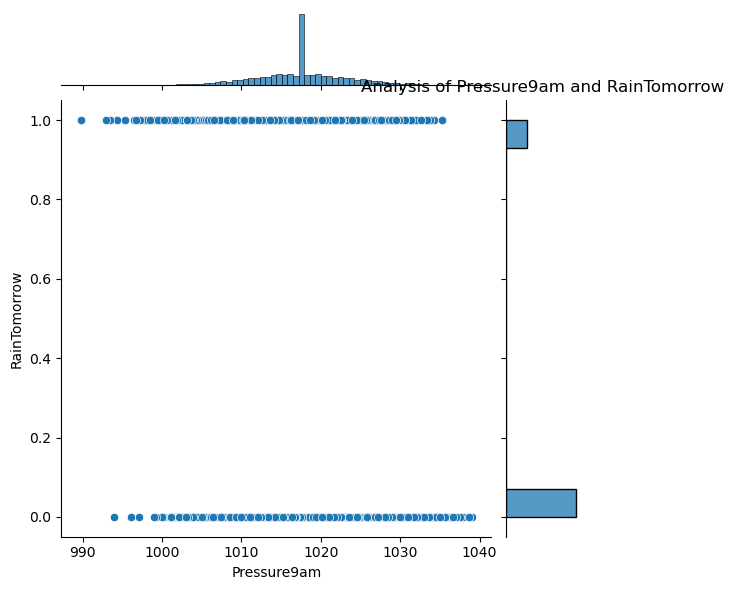

In [169]:
sns.jointplot(x='Pressure9am', y='RainTomorrow', data=rf, kind='scatter')
plt.title('Analysis of Pressure9am and RainTomorrow')
plt.show()

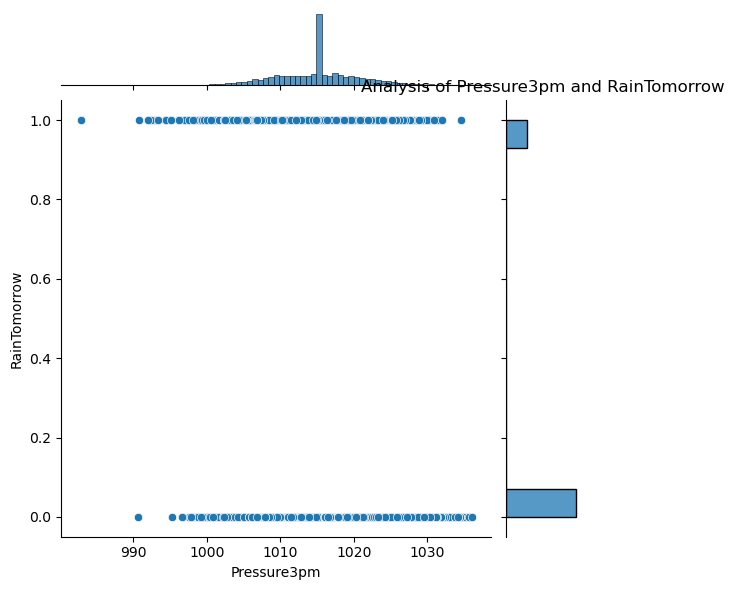

In [170]:
sns.jointplot(x='Pressure3pm', y='RainTomorrow', data=rf, kind='scatter')
plt.title('Analysis of Pressure3pm and RainTomorrow')
plt.show()

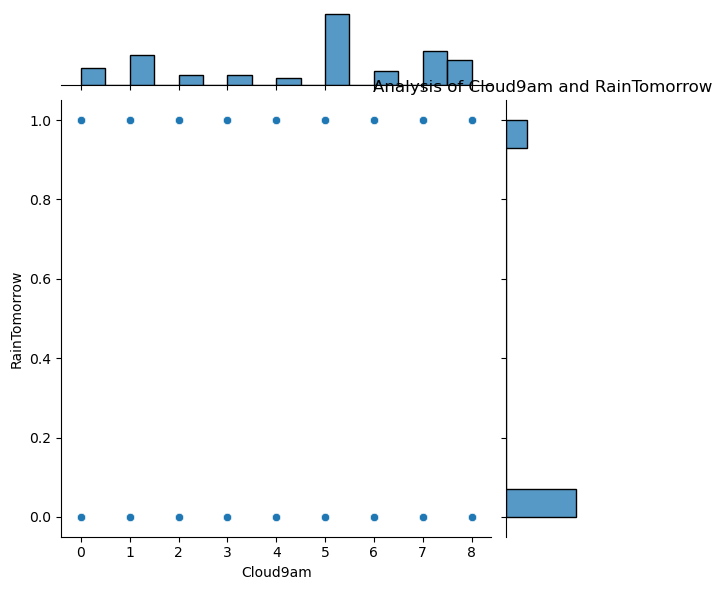

In [171]:
sns.jointplot(x='Cloud9am', y='RainTomorrow', data=rf, kind='scatter')
plt.title('Analysis of Cloud9am and RainTomorrow')
plt.show()

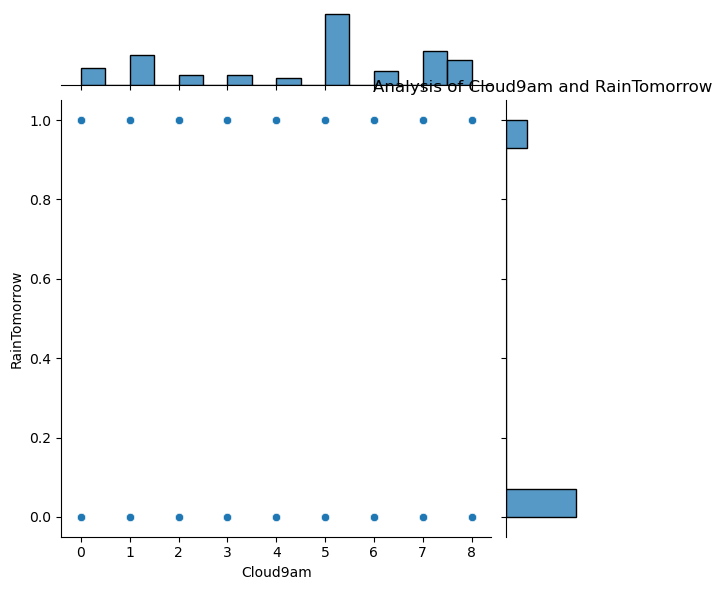

In [172]:
sns.jointplot(x='Cloud9am', y='RainTomorrow', data=rf, kind='scatter')
plt.title('Analysis of Cloud9am and RainTomorrow')
plt.show()

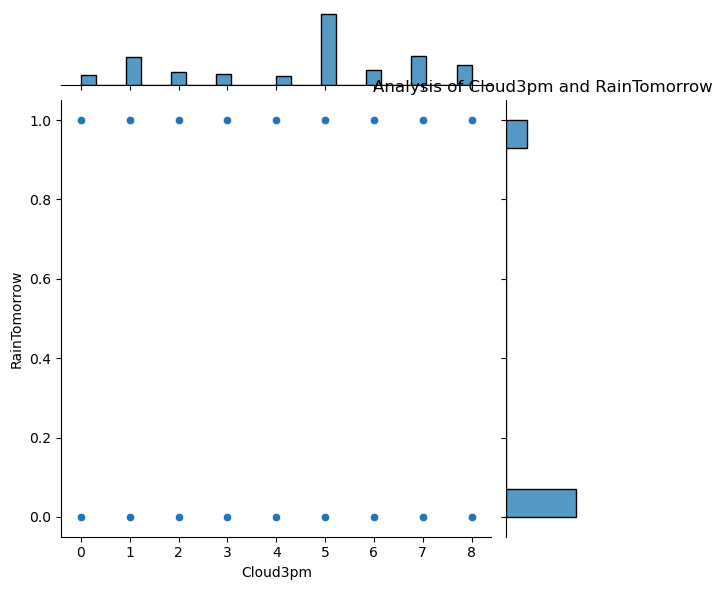

In [173]:
sns.jointplot(x='Cloud3pm', y='RainTomorrow', data=rf, kind='scatter')
plt.title('Analysis of Cloud3pm and RainTomorrow')
plt.show()

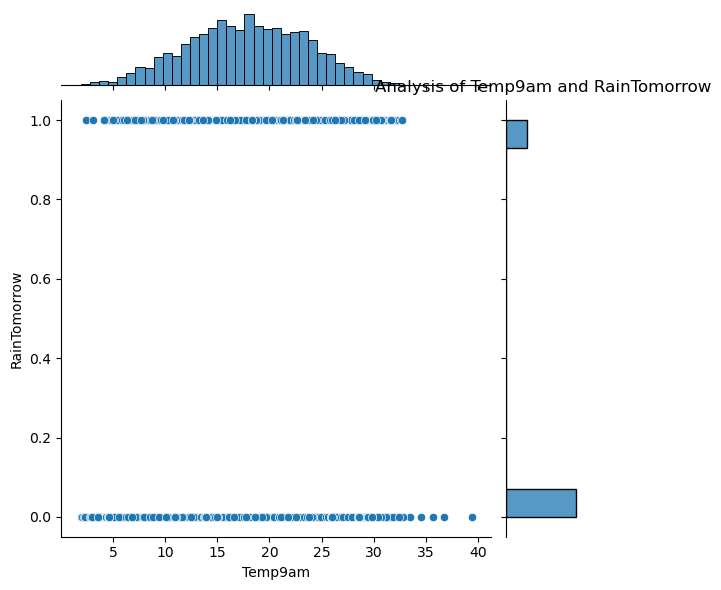

In [174]:
sns.jointplot(x='Temp9am', y='RainTomorrow', data=rf, kind='scatter')
plt.title('Analysis of Temp9am and RainTomorrow')
plt.show()

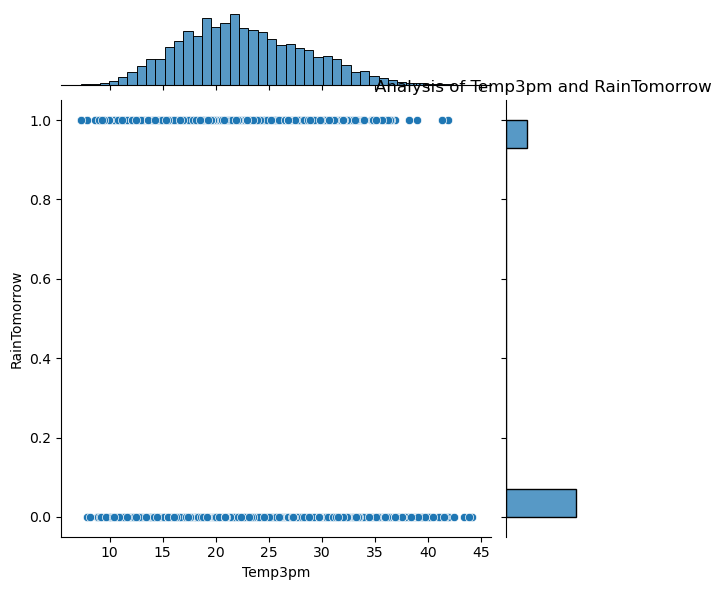

In [175]:
sns.jointplot(x='Temp3pm', y='RainTomorrow', data=rf, kind='scatter')
plt.title('Analysis of Temp3pm and RainTomorrow')
plt.show()

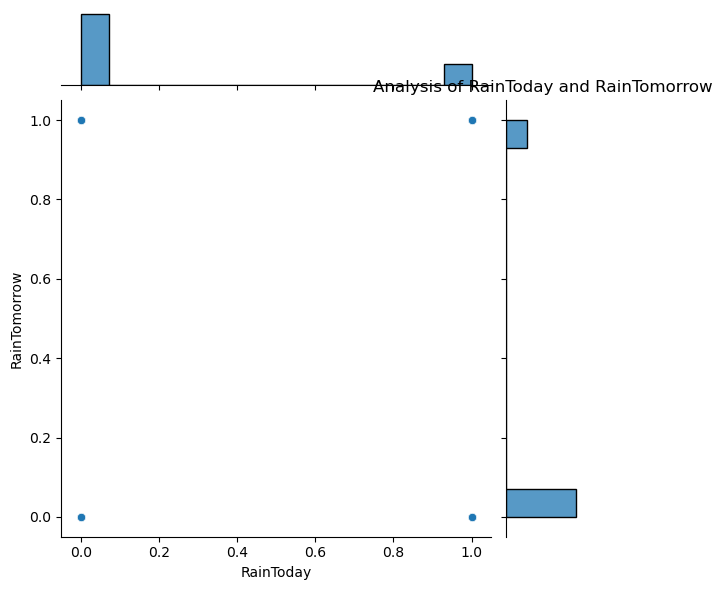

In [176]:
sns.jointplot(x='RainToday', y='RainTomorrow', data=rf, kind='scatter')
plt.title('Analysis of RainToday and RainTomorrow')
plt.show()

# Multivariant analysis

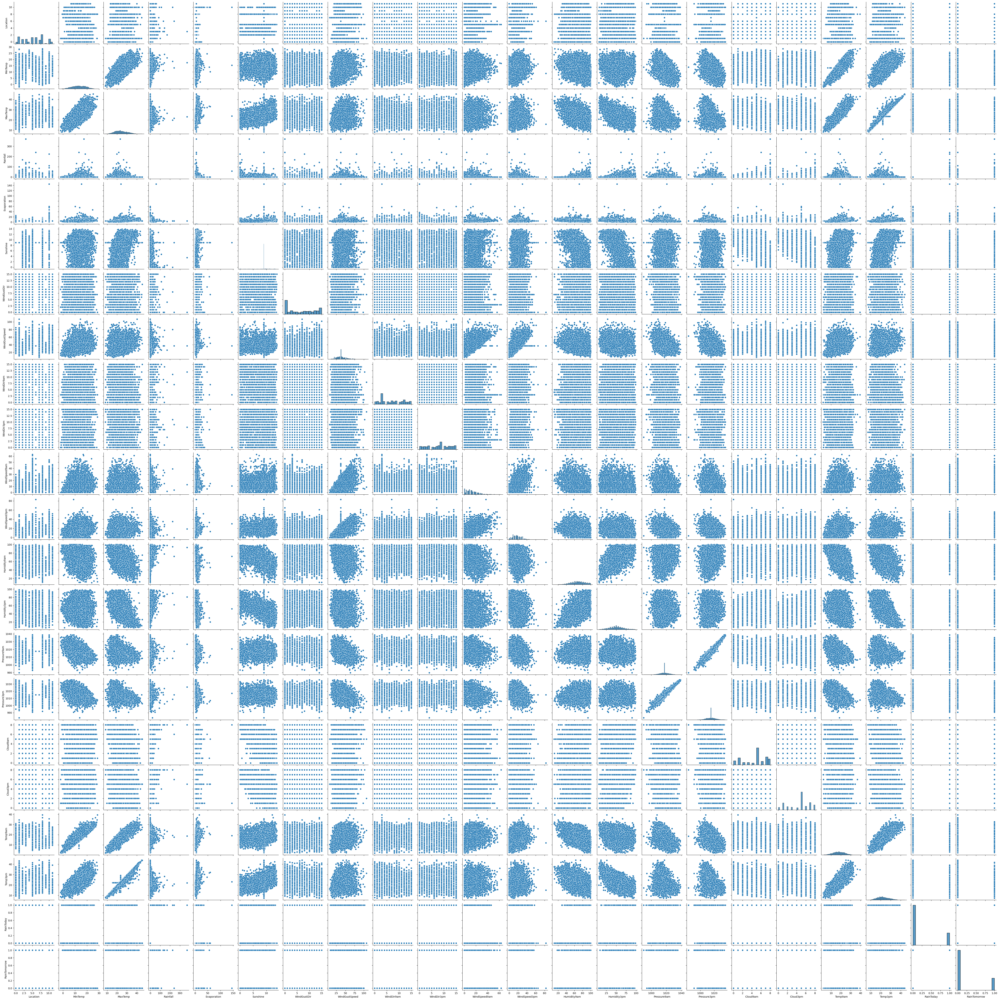

In [177]:
sns.pairplot(rf)
plt.show()

In [102]:
#Let's find the correlation
corr = rf.corr()

<AxesSubplot:>

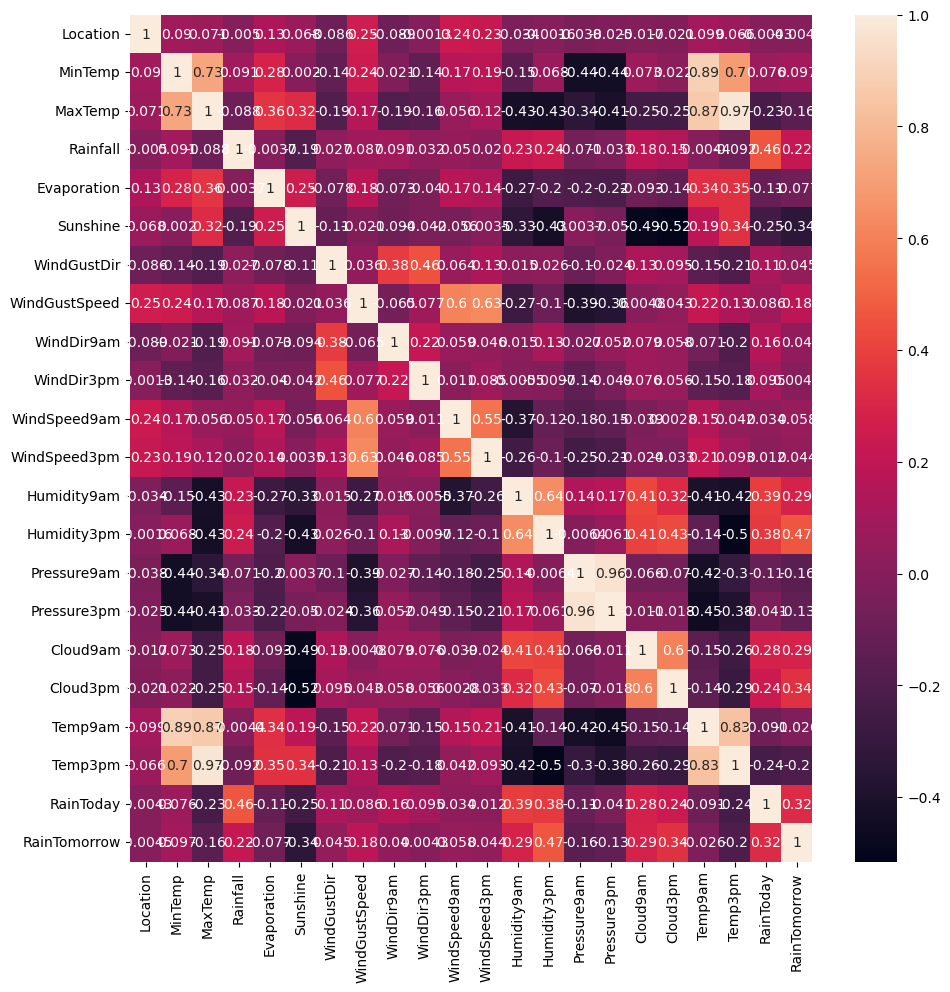

In [107]:
plt.figure(figsize=(11,11))
sns.heatmap(corr, annot=True)

# 'Rain tomorrow as the target variable'


In [108]:
X= rf.iloc[:,0:-1]

In [158]:
#Let's check the skewness 
X.skew()

Location         -0.000009
MinTemp          -0.084215
MaxTemp           0.330020
Rainfall         13.637400
Evaporation      13.603792
Sunshine         -1.378286
WindGustDir       0.105287
WindGustSpeed     0.838665
WindDir9am        0.220355
WindDir3pm       -0.123726
WindSpeed9am      0.961630
WindSpeed3pm      0.552405
Humidity9am      -0.256862
Humidity3pm       0.151933
Pressure9am       0.024619
Pressure3pm       0.044933
Cloud9am         -0.426084
Cloud3pm         -0.396334
Temp9am          -0.047627
Temp3pm           0.352174
RainToday         1.266937
dtype: float64

In [157]:
rf.loc[:, 'Rainfall'] = np.log1p(rf['Rainfall'])
rf['Rainfall'].skew()

0.7126065364371239

In [117]:
rf.loc[:, 'Evaporation'] = np.sqrt(rf['Evaporation'])
rf['Evaporation'].skew()

-0.3835861933539972

In [112]:

rf.loc[:, 'RainToday'] = np.cbrt(rf['RainToday'])
rf['RainToday'].skew()

1.2669368494588975

Let's split the data to fit in the model

In [113]:
x= rf.iloc[:,0:-1]

In [114]:
y= rf.iloc[:,-1]

In [115]:
#Let's apply Logistic Regression and check the highest accuracy score that can be obtained and the random state at which
idle_score = 0.70

best_random_state = None
best_accuracy = 0.0

for r_state in range(1,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20, random_state=r_state)
    lg=LogisticRegression()
    lg.fit(x_train,y_train)
    lgpred=lg.predict(x_test)
    acc = accuracy_score(y_test,lgpred)
    
    if acc> best_accuracy:
        best_accuracy= acc
        best_randome_state = r_state
    

if best_accuracy > idle_score:
    print("The best accuracy rate is", best_accuracy, "for random state:", best_randome_state)
else:
    print("No random state achieved an accuracy greater than the threshold.")

The best accuracy rate is 0.8558758314855875 for random state: 68


In [159]:
#Let's try using the RandomForest Classifier 
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier()

idle_score = 0.85

best_random_state = None
best_accuracy = 0.0

for r_state in range(1,100):
    x_train,x_test,y_train,y_test= train_test_split(x,y, test_size=0.20, random_state=r_state)
    rfmodel= RandomForestClassifier()
    rfmodel.fit(x_test,y_test)
    rfmodelpred=rfmodel.predict(x_test)
    acc= accuracy_score(y_test,rfmodelpred)
    
    if acc> best_accuracy:
        best_accuracy= acc
        best_random_state= r_state

if best_accuracy > idle_score:
    print("the best Accuracy rate is ", best_accuracy, "For Random State ", best_random_state)
else:
    Print("No randome state achieved the accuracy greater than the threshold")


the best Accuracy rate is  1.0 For Random State  3


In [160]:
#Let's print the confusion_matrix of the Random_forest_model
print(confusion_matrix(y_test,rfmodelpred))

[[1042    0]
 [   0  311]]


<AxesSubplot:>

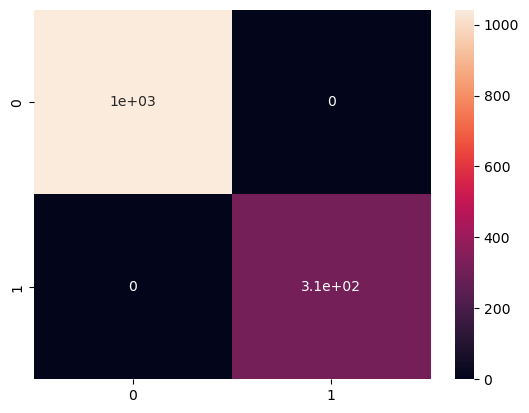

In [161]:
sns.heatmap(confusion_matrix(y_test,rfmodelpred), annot=True)

In [162]:
#Let's print the Classification_report of the Random_forest_model
print(classification_report(y_test,rfmodelpred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1042
           1       1.00      1.00      1.00       311

    accuracy                           1.00      1353
   macro avg       1.00      1.00      1.00      1353
weighted avg       1.00      1.00      1.00      1353



# Saving the model

In [163]:
import joblib
filename = 'RandomForest_model.pkl'
joblib.dump(rfmodel, filename)
print(f'Model saved as {filename}')

Model saved as RandomForest_model.pkl


# 'rainfall as the target variable'

In [164]:
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, make_scorer, mean_absolute_error
from sklearn.model_selection import cross_val_score, KFold, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA

In [165]:
df_X = rf.iloc[:, rf.columns != rf.columns[2]]

In [166]:
#Let's check for the skewness
df_X.skew()

Location        -0.000009
MinTemp         -0.084215
Rainfall         0.712607
Evaporation     -0.383586
Sunshine        -1.378286
WindGustDir      0.105287
WindGustSpeed    0.838665
WindDir9am       0.220355
WindDir3pm      -0.123726
WindSpeed9am     0.961630
WindSpeed3pm     0.552405
Humidity9am     -0.256862
Humidity3pm      0.151933
Pressure9am      0.024619
Pressure3pm      0.044933
Cloud9am        -0.426084
Cloud3pm        -0.396334
Temp9am         -0.047627
Temp3pm          0.352174
RainToday        1.266937
RainTomorrow     1.266937
dtype: float64

Let's split the data to fit in the model

In [167]:
X= rf.iloc[:, rf.columns != rf.columns[3]]

In [168]:
Y= rf.loc[:, 'Rainfall']

In [169]:
X_train,X_test,Y_train,Y_test = train_test_split(X,Y, test_size=0.20, random_state=42)

In [170]:
scaler = StandardScaler()
X_train =scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [171]:
pca=PCA(n_components=15)
x_pca =pca.fit_transform(x)

In [172]:
model = LinearRegression()

In [173]:
model.fit(X_train,Y_train)

LinearRegression()

In [174]:
modelpred = model.predict(X_test)

In [175]:
model.score(X_train,Y_train)

0.704377932672638

In [176]:
mse = mean_squared_error(Y_test, modelpred)
r2 = r2_score(Y_test, modelpred)

In [177]:
print(f"Mean Squared Error: {mse:.2f}")
print(f"R-squared: {r2:.2f}")

Mean Squared Error: 0.00
R-squared: 0.69


In [179]:
#Let's create a funtion for the model to check the results at different random states and preint the r2 score value
def maxr2_score(regr,X,Y):
    max_r_score=0
    for r_state in range(42,100):
        X_train, X_test, Y_train, Y_test = train_test_split(X, Y,random_state = r_state,test_size=0.20)
        regr.fit(X_train,Y_train)
        Y_pred = regr.predict(X_test)
        r2_scr=r2_score(Y_test,Y_pred)
        
        if r2_scr>max_r_score:
            max_r_score=r2_scr
            final_r_state=r_state
    print("max r2 score corresponding to ",final_r_state," is ",max_r_score)
    return final_r_state

In [180]:
#lets make use of KNN regressor
#we will use pipeline to bring bring features to common scale

knr=KNeighborsRegressor()
pipeline=Pipeline([("pca",PCA(n_components=15)),("knr",KNeighborsRegressor())])
parameters = {"knr__n_neighbors":range(2,30)}
clf = GridSearchCV(pipeline, parameters, cv=5,scoring="r2")
clf.fit(X,Y)
clf.best_params_

{'knr__n_neighbors': 29}

In [181]:
#knr=KNeighborsRegressor(n_neighbors=4)
pipeline_knr=Pipeline([("ss",StandardScaler()),("knr",KNeighborsRegressor(n_neighbors=29))])
maxr2_score(pipeline_knr,X,Y)

max r2 score corresponding to  50  is  0.7128121243698387


50

In [182]:
#Lets use random forest regressor
from sklearn.ensemble import RandomForestRegressor
import warnings
warnings.filterwarnings("ignore")
rfr=RandomForestRegressor()
pipeline=Pipeline([("ss",StandardScaler()),("pca",PCA(n_components=15)),("rfr",RandomForestRegressor())])
parameters = {"rfr__n_estimators":[10,100,500]}
clf = GridSearchCV(pipeline, parameters, cv=5,scoring="r2")
clf.fit(X,Y)
clf.best_params_

{'rfr__n_estimators': 500}

In [184]:
pipeline_rfr=Pipeline([("ss",StandardScaler()),("rfr",RandomForestRegressor(n_estimators=500))])
maxr2_score(pipeline_rfr,X,Y)

max r2 score corresponding to  50  is  0.7544241066997136


50

# Saving the model

In [185]:
import joblib
filename = 'RFR.pkl'
joblib.dump(rfr, filename)
print(f'Model saved as {filename}')

Model saved as RFR.pkl
